# Notebook to setup the radcalnet_oc package

In [1]:

import os, shutil
import glob

import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
rc = {"font.family": "serif",
      "mathtext.fontset": "stix"}
plt.rcParams.update(rc)
plt.rcParams["font.serif"] = ["Times New Roman"] + plt.rcParams["font.serif"]

plt.rcParams.update({'font.size': 18, 'axes.labelsize': 22})
import numpy as np
import xarray as xr
import pandas as pd
import datetime as dt

import radcalnet_oc as radoc

print(f'-radcalnet_oc: {radoc.__version__}')
opj=os.path.join

-radcalnet_oc: 0.0.1


In [2]:

sites = ['Abu_Al_Bukhoosh', 'ARIAKE_TOWER', 'Bahia_Blanca', 'Banana_River',
       'Bari_Waterfront', 'encodingBlyth_NOAH', 'Casablanca_Platform',
       'Chesapeake_Bay', 'COVE_SEAPRISM', 'Gageocho_Station',
       'Galata_Platform', 'Gloria', 'Gotland', 'GOT_Seaprism', 'Grizzly_Bay',
       'Gustav_Dalen_Tower', 'HBOI', 'Helsinki_Lighthouse', 'Ieodo_Station',
       'Irbe_Lighthouse', 'KAUST_Campus', 'Kemigawa_Offshore', 'Lake_Erie',
       'Lake_Okeechobee', 'Lake_Okeechobee_N', 'LISCO', 'Lucinda', 'MVCO',
       'Palgrunden', 'PLOCAN_Tower', 'RdP-EsNM', 'Sacramento_River',
       'San_Marco_Platform', 'Section-7_Platform', 'Socheongcho',
       'South_Greenbay', 'Thornton_C-power', 'USC_SEAPRISM', 'USC_SEAPRISM_2',
       'Venise', 'WaveCIS_Site_CSI_6', 'Zeebrugge-MOW1']
bandIds = range(13)
resolution = 20
width, height = 5000, 5000
complevel=5
datadir = '/data/satellite/Sentinel-2/L1C/'
odir = '/data/satellite/Sentinel-2/subset/aeronet/L1C'
figdir = '/data/radcalnet/fig/timeseries'
info = pd.read_csv('/DATA/AERONET/info_aeronet_oc_v15_location.csv',index_col=0)
xinfo = info.to_xarray()
info

,start_date,end_date,number,latitude,longitude,s2_tile
site,,,,,,
Abu_Al_Bukhoosh,2015-07-01,2015-07-01,0,25.495000,53.145833,39RYJ
ARIAKE_TOWER,2018-02-23,2023-03-19,2001,33.103617,130.271950,52SFB
Bahia_Blanca,2020-01-23,2024-09-03,4936,-39.148000,-61.722000,20HPB
Banana_River,2022-06-16,2025-01-25,2006,28.367000,-80.633000,17RNM
Bari_Waterfront,2015-07-01,2015-07-01,0,41.116800,16.893400,33TXF
Blyth_NOAH,2016-04-21,2017-09-19,33,55.146399,-1.420859,30UWG
Casablanca_Platform,2019-04-02,2025-03-31,18735,40.717000,1.358000,31TCF
Chesapeake_Bay,2021-10-07,2025-03-31,12554,39.124000,-76.359000,18SUJ
COVE_SEAPRISM,2015-11-15,2016-01-09,163,36.900000,-75.710000,18SVF


In [3]:
site= 'Galata_Platform' # 'Venise' #
level='lev20'
info_ = xinfo.sel(site=site)
tile =  str(info_.s2_tile.values)
clon,clat = info_.longitude.values,info_.latitude.values
print(tile,clon,clat)
aeronet_oc = xr.open_mfdataset(opj('/DATA/AERONET/netcdf/OCv3',level,site+'*'+level+'.nc')).load().sel(time=slice('2017','2024'))
aeronet_oc

35TNH 28.19319 43.044624


<xarray.Dataset> Size: 22MB
Dimensions:                       (time: 7586, wl: 14)
Coordinates:
  * time                          (time) datetime64[ns] 61kB 2017-01-02T08:22...
  * wl                            (wl) float64 112B 412.0 443.0 ... 779.0 865.0
Data variables: (12/45)
    Aerosol_Optical_Depth         (time, wl) float64 850kB 0.04732 ... 0.03637
    wavelength                    (time, wl) float64 850kB 0.4125 ... 0.8651
    Li_mean                       (time, wl) float64 850kB 4.85 4.343 ... 0.3027
    Li_stddev                     (time, wl) float64 850kB 0.001618 ... 0.000666
    Lt_mean                       (time, wl) float64 850kB 0.4049 ... 0.01291
    Lt_min_rel                    (time, wl) float64 850kB 0.3791 ... 0.01143
    ...                            ...
    year                          (time) int64 61kB 2017 2017 2017 ... 2023 2023
    season                        (time) <U3 91kB 'DJF' 'DJF' ... 'DJF' 'DJF'
    Rrs_Lw                        (time, wl) float64 850kB 0.001401 ... 3.099...
    Rrs_Lwn                       (time, wl) float64 850kB 0.006795 ... 7.883...
    Rrs_Lwn_IOP                   (time, wl) float64 850kB 0.005839 ... 7.883...
    Rrs_Lwn_fQ                    (time, wl) float64 850kB 0.005964 ... 7.883...

In [8]:
## Convert gas concentration into kg m-2

In [17]:
# tcwv cm into kg.m-2
tpw_cm=aeronet_oc['Total_Precipitable_Water(cm)']
aeronet_oc['tcwv']=tpw_cm*10 
aeronet_oc['tcwv'].attrs['unit']='kg.m-2'
# conversion DU to kg.m-2
to3_du=aeronet_oc['Total_Ozone(Du)'] 
aeronet_oc['tco3']=to3_du *2.14485e-5
aeronet_oc['tco3'].attrs['unit']='kg.m-2'
tcno2_du = aeronet_oc['Total_NO2(DU)']
aeronet_oc['tcno2']=tcno2_du*2.055482e-5
aeronet_oc['tcno2'].attrs['unit']='kg.m-2'

aeronet_oc['pressure']=aeronet_oc['Pressure(hPa)']
aeronet_oc['pressure'].attrs['unit']='hPa'

aeronet_oc['sza']=aeronet_oc['SZA']
aeronet_oc['day_of_year']=aeronet_oc['Day_of_Year']
aeronet_oc=aeronet_oc.sortby('wl')

# to make sure that AOT is available at 550nm
aeronet_oc['aot550'] = aeronet_oc['Aerosol_Optical_Depth'].interpolate_na('wl').interp(wl=550)
aeronet_oc['aot865'] = aeronet_oc['Aerosol_Optical_Depth'].interpolate_na('wl').interp(wl=865)

# get values for the Angstrom exponent
aeronet_oc['ang_exp'] = -(np.log(aeronet_oc['aot550']/aeronet_oc['aot865'])/np.log(550/865))# to make sure that AOT is available at 550nm




In [16]:
aeronet_oc.sortby('wl')['Aerosol_Optical_Depth'].interpolate_na('wl')

<xarray.DataArray 'Aerosol_Optical_Depth' (time: 7586, wl: 14)> Size: 850kB
array([[       nan, 0.047322  , 0.046339  , ..., 0.02277002, 0.02273   ,
        0.017877  ],
       [       nan, 0.050769  , 0.048521  , ..., 0.02441525, 0.024357  ,
        0.018677  ],
       [       nan, 0.043065  , 0.03923   , ..., 0.0212258 , 0.021209  ,
        0.015779  ],
       ...,
       [0.074905  , 0.073414  , 0.067789  , ..., 0.021437  , 0.02132206,
        0.017874  ],
       [0.065119  , 0.065349  , 0.062868  , ..., 0.037185  , 0.03716665,
        0.036616  ],
       [0.063852  , 0.064028  , 0.061466  , ..., 0.036372  , 0.03635077,
        0.035714  ]])
Coordinates:
  * time     (time) datetime64[ns] 61kB 2017-01-02T08:22:55 ... 2023-01-01T10...
  * wl       (wl) float64 112B 400.0 412.0 443.0 490.0 ... 865.0 870.0 1.02e+03

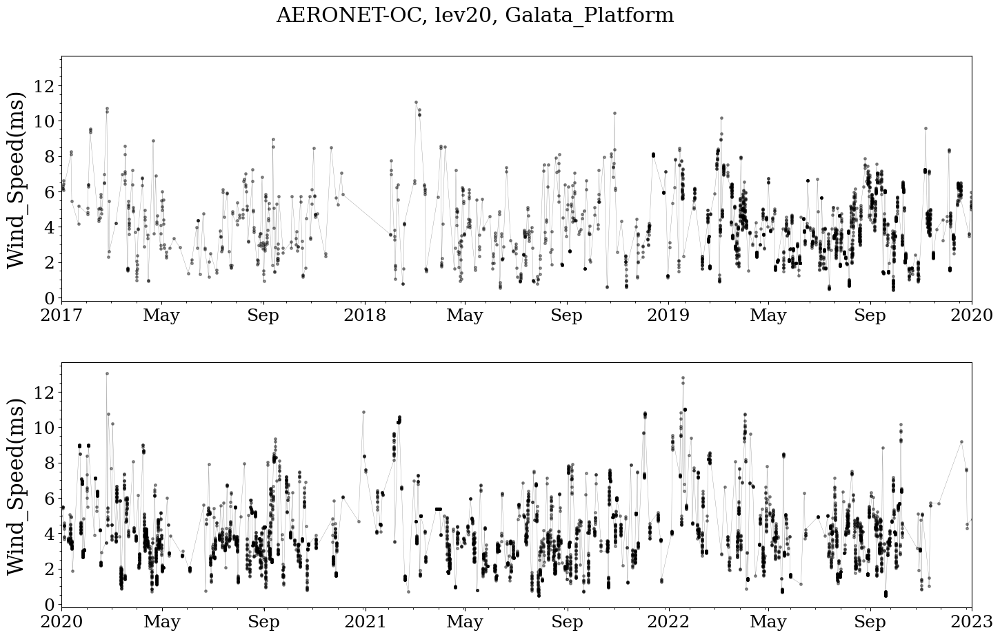

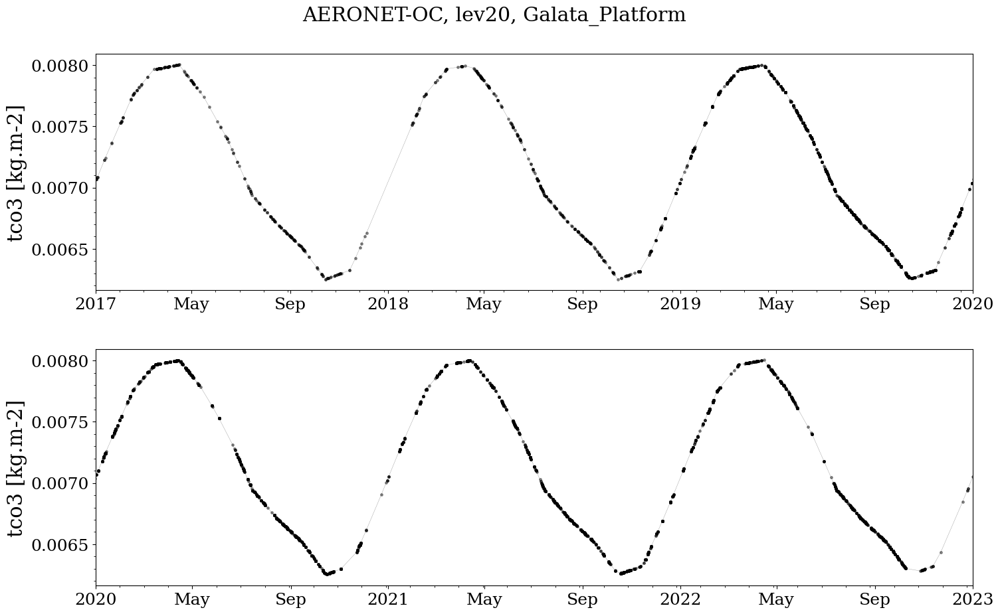

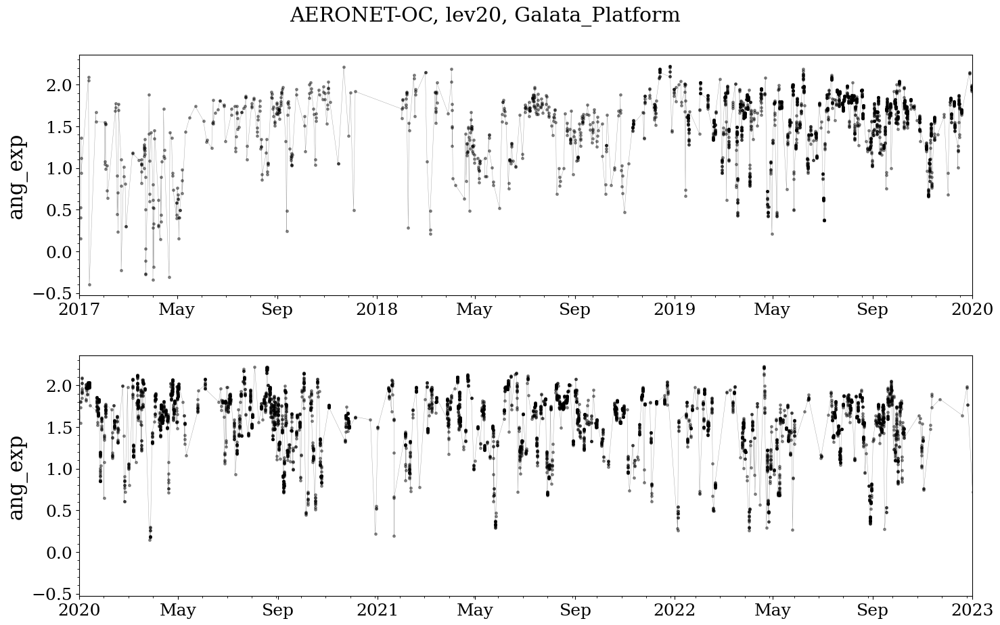

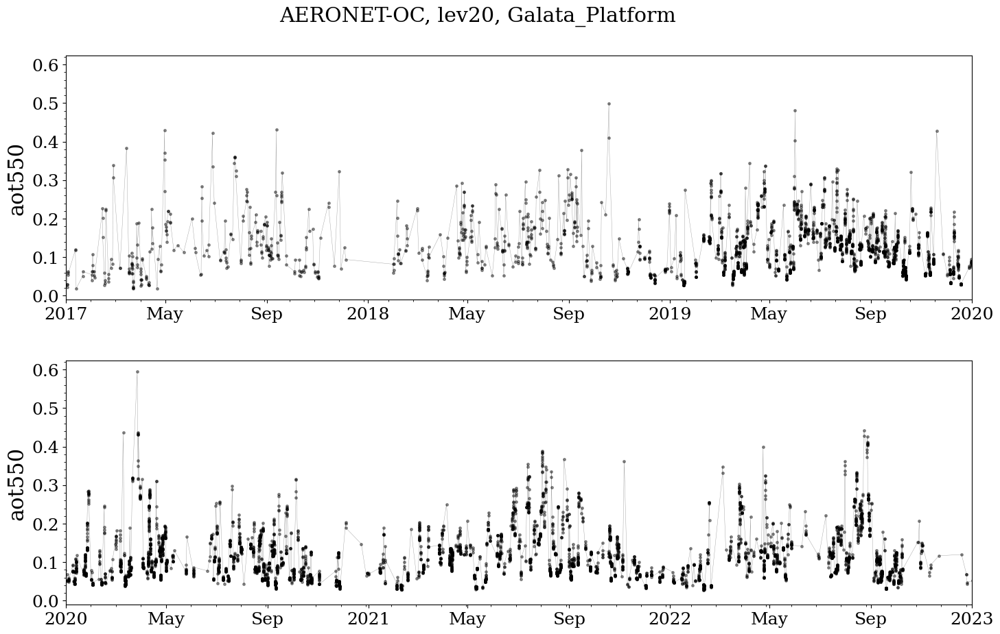

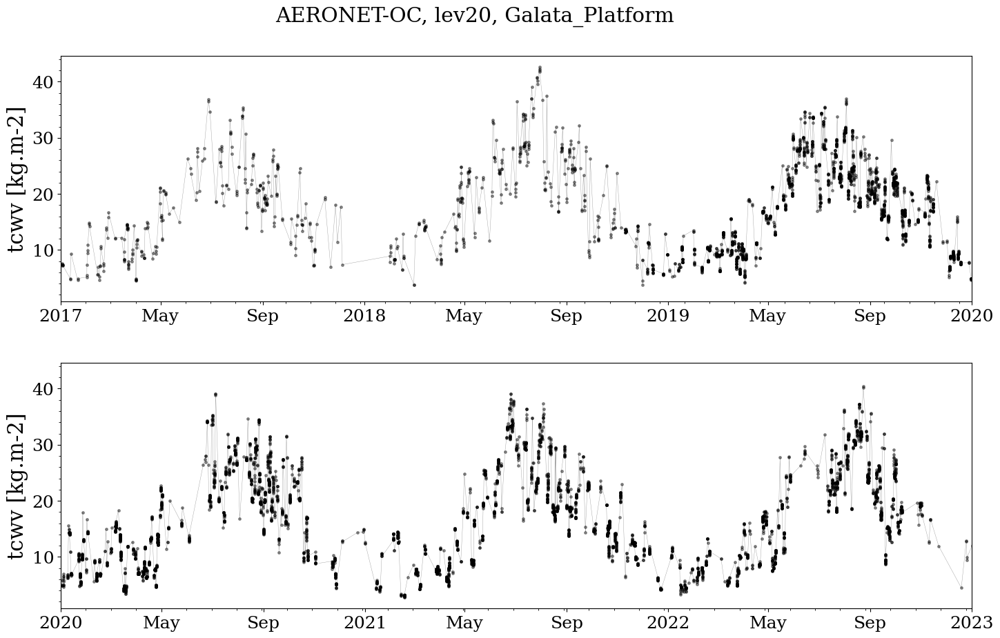

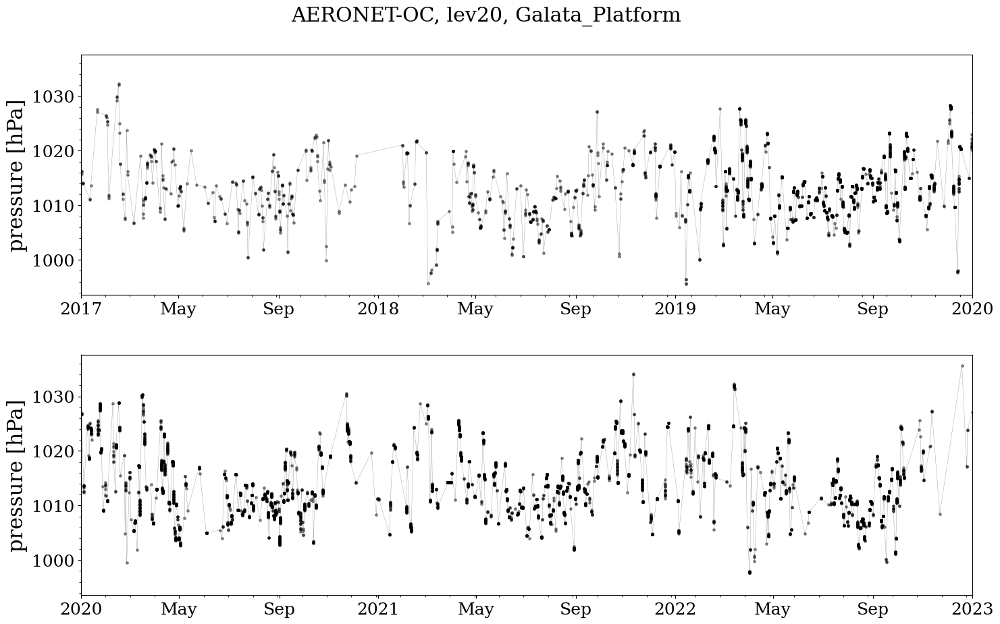

In [18]:
start_year = 2017
year_per_row = 3
time_range=slice('2017','2024')
chl_max=30
params=['Wind_Speed(ms)','tco3','ang_exp','aot550','tcwv','pressure']
#ylabels = 
for ii,param in enumerate(params):
    
   
 
    fig, axs = plt.subplots(nrows=2, ncols=1, sharey=True, figsize=(15, 9))
    fig.subplots_adjust(bottom=0.01, top=0.9, left=0.1, right=0.98, hspace=0.25, wspace=0.025)
    for iax, ax in enumerate(axs):          
        
        ax.minorticks_on()
        aeronet_oc[param].plot(marker="o",alpha=0.4,c='k',ms=2.5,lw=0.3,ax=ax)
        #ds['Chla_ug/l'].sel(date=time_range,nom_station='H12').plot(hue='Profondeur_m',marker='o',ms=5,ls='',ax=ax)
        
        #ax.set_ylim(0.2,30)
        ax.set_xlim([dt.date(start_year + iax * year_per_row, 1, 1), dt.date(start_year + (iax + 1) * year_per_row, 1, 1)])
        #ax.set_ylabel(ylabels[ii])
        ax.set_xlabel('')
        ax.set_title('')
    plt.suptitle('AERONET-OC, '+level+', '+site)
    figpath = opj(figdir,site+'_'+level+'_'+param+'.png')
    plt.savefig(figpath, bbox_inches='tight')
    plt.show()       

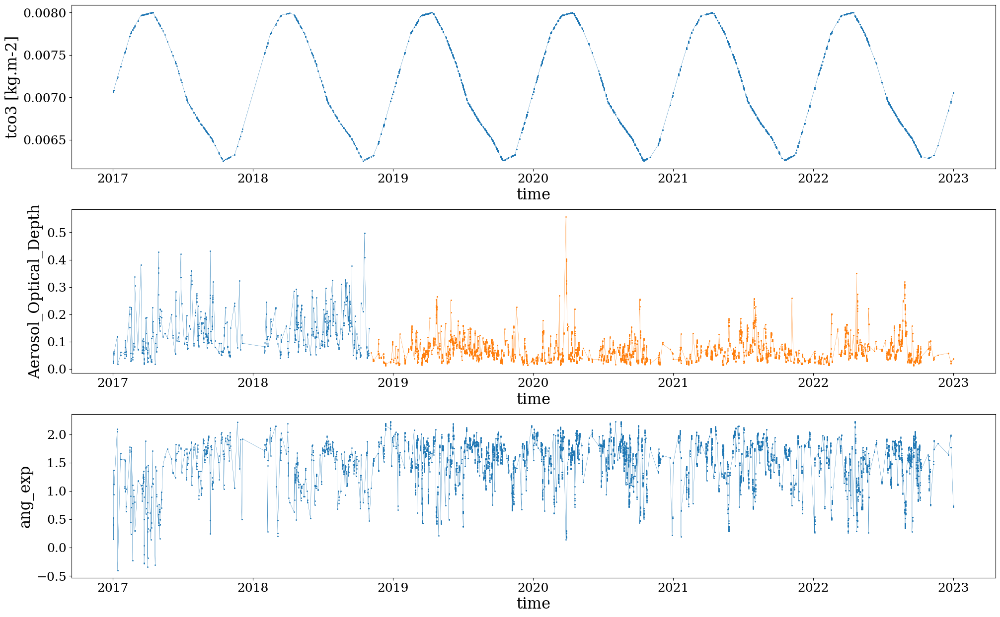

In [19]:
aeronet_oc_ = aeronet_oc.sel(time=slice('2017-01','2024-07'))

fig, axs = plt.subplots(ncols=1,nrows=3, figsize=(24, 15))
fig.subplots_adjust(hspace=0.25, wspace=0.25)
aeronet_oc_['tco3'].plot(marker="o",ms=1,lw=0.3,ax=axs[0])
aeronet_oc_.Aerosol_Optical_Depth.sel(wl=550,method='nearest').plot(marker="o",ms=1,lw=0.3,ax=axs[1])
aeronet_oc_.Aerosol_Optical_Depth.sel(wl=865,method='nearest').plot(marker="o",ms=1,lw=0.3,ax=axs[1])

aeronet_oc_['ang_exp'].plot(marker="o",ms=1,lw=0.3,ax=axs[2])
#dc.datacube.mean_solar_azimuth.plot()
for ax in axs:
    ax.set_title('')

INFO:root:get LUT object
INFO:root:loading look-up tables
INFO:root:get auxiliary data
INFO:root:loading look-up tables
INFO:root:get solar irradiance
INFO:root:get gaseous transmittance object
INFO:root:set input parameters
INFO:root:LUT preparation


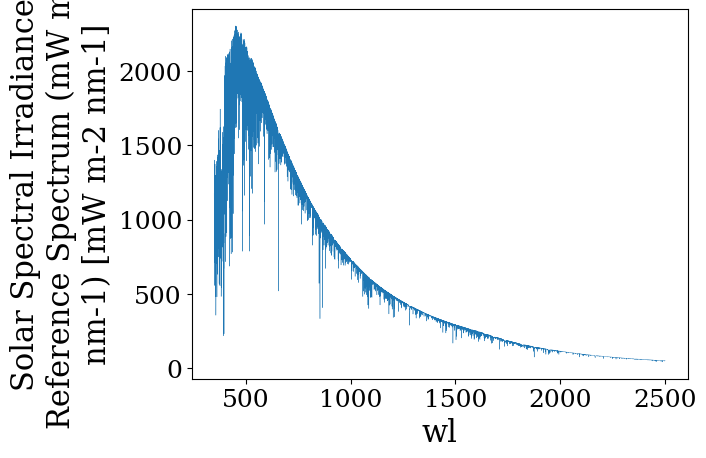

In [20]:
radoc_process = radoc.Process(aeronet_oc_,Rrs_name='Rrs_Lw')
radoc_process.lut_preparation()
radoc_process.F0.plot(lw=0.3)

In [21]:
radoc_process.get_downwelling_irradiance(aerosol_combination=[0, 0.5, 0.5, 0., 0.0])
Ed = radoc_process.Ed
fwhm=15
central_wl = aeronet_oc.wavelength.mean('time')*1000
spectral=radoc.Spectral(central_wl,fwhm)
Ed_int = spectral.convolve2(Ed,expon=5).to_dataarray()
#Ed_int['sza']=Ed.sza
Ed_int['wl']=aeronet_oc.wl
Ed_int=Ed_int.squeeze()

In [22]:
radoc_process.lut.trans_aero_lut#Tra_d.isel(time=0).plot()

<xarray.DataArray (aot_ref: 25, wl: 10, sza: 582)> Size: 1MB
array([[[0.76947981, 0.75843775, 0.75832677, ..., 0.42493018,
         0.42208922, 0.41356634],
        [0.85429639, 0.84655576, 0.84647758, ..., 0.54213054,
         0.53789429, 0.52518554],
        [0.93612528, 0.93242461, 0.93238708, ..., 0.75109015,
         0.74680507, 0.73394985],
        ...,
        [0.99935961, 0.99932005, 0.99931964, ..., 0.99796037,
         0.99791704, 0.99778706],
        [0.99982059, 0.99980955, 0.99980943, ..., 0.99942819,
         0.99941626, 0.99938046],
        [0.99989152, 0.9998847 , 0.99988463, ..., 0.99964643,
         0.99963917, 0.99961737]],

       [[0.76316781, 0.75177811, 0.75166366, ..., 0.41568263,
         0.41298017, 0.40487281],
        [0.84838126, 0.84022525, 0.84014264, ..., 0.52399995,
         0.5199323 , 0.50772934],
        [0.93111879, 0.92698378, 0.92694197, ..., 0.71577183,
         0.71108837, 0.69703799],
...
        [0.95613619, 0.95205475, 0.95201237, ..., 0.63796618,
         0.63232641, 0.61540712],
        [0.9739681 , 0.97144435, 0.97141805, ..., 0.73329319,
         0.72805751, 0.71235046],
        [0.97624323, 0.97407371, 0.97405114, ..., 0.76159847,
         0.75651512, 0.74126505]],

       [[0.62933762, 0.61249303, 0.61232529, ..., 0.29751617,
         0.29600699, 0.29147946],
        [0.71795203, 0.70233049, 0.70217362, ..., 0.34697202,
         0.34510361, 0.33949837],
        [0.81598701, 0.80323292, 0.80310343, ..., 0.40904143,
         0.40644883, 0.39867105],
        ...,
        [0.9542178 , 0.94995582, 0.94991157, ..., 0.6286921 ,
         0.62305961, 0.60616217],
        [0.97281794, 0.97017992, 0.97015243, ..., 0.72525585,
         0.71997491, 0.70413209],
        [0.97519673, 0.97292944, 0.97290586, ..., 0.75378986,
         0.74863852, 0.73318447]]])
Coordinates:
  * wl       (wl) float32 40B 350.0 400.0 500.0 ... 1.6e+03 2.2e+03 2.5e+03
  * sza      (sza) float64 5kB 0.0 19.7 19.8 19.9 20.0 ... 80.2 80.3 80.5 81.1
  * aot_ref  (aot_ref) float64 200B 0.0 0.03333 0.06667 ... 0.7333 0.7667 0.8

In [23]:
aeronet_oc_['Rrs_radoc'] = (10*aeronet_oc_.Lw/Ed_int).reset_coords(drop=True)

In [24]:
radoc_process.lut.trans_aero_lut.interp(sza=radoc_process.sza,
                                                    aot_ref=radoc_process.aot550
                                                    ).interpolate_na('time').interp(wl=np.linspace(350,2500,100), method='cubic')#.interp(wl=radoc_process.full_wl)#, method='quadratic')

<xarray.DataArray (time: 7586, wl: 100)> Size: 6MB
array([[0.53948329, 0.59999451, 0.65363013, ..., 0.99547278, 0.99546281,
        0.99544335],
       [0.55472448, 0.61502921, 0.66801021, ..., 0.9957488 , 0.995736  ,
        0.99571342],
       [0.57875812, 0.6386965 , 0.69073312, ..., 0.99698764, 0.99697937,
        0.99696386],
       ...,
       [0.56866423, 0.62752751, 0.67879913, ..., 0.99399365, 0.99399773,
        0.99399112],
       [0.56764135, 0.62632113, 0.67744546, ..., 0.99355624, 0.99356447,
        0.99356169],
       [0.56528962, 0.62407521, 0.67535421, ..., 0.99356167, 0.99356811,
        0.99356321]])
Coordinates:
    sza      (time) float64 61kB 70.36 68.79 66.35 70.27 ... 66.56 66.53 66.83
    aot_ref  (time) float64 61kB 0.02895 0.0293 0.02275 ... 0.05152 0.05071
  * time     (time) datetime64[ns] 61kB 2017-01-02T08:22:55 ... 2023-01-01T10...
  * wl       (wl) float64 800B 350.0 371.7 393.4 ... 2.457e+03 2.478e+03 2.5e+03

In [25]:
aeronet_oc_

<xarray.Dataset> Size: 23MB
Dimensions:                       (time: 7586, wl: 14)
Coordinates:
  * time                          (time) datetime64[ns] 61kB 2017-01-02T08:22...
  * wl                            (wl) float64 112B 400.0 412.0 ... 1.02e+03
Data variables: (12/55)
    Aerosol_Optical_Depth         (time, wl) float64 850kB nan ... 0.03571
    wavelength                    (time, wl) float64 850kB nan 0.4125 ... 1.02
    Li_mean                       (time, wl) float64 850kB nan 4.85 ... 0.1512
    Li_stddev                     (time, wl) float64 850kB nan ... 0.00021
    Lt_mean                       (time, wl) float64 850kB nan ... 0.00615
    Lt_min_rel                    (time, wl) float64 850kB nan ... 0.004902
    ...                            ...
    sza                           (time) float64 61kB 70.36 68.79 ... 66.83
    day_of_year                   (time) int64 61kB 2 2 2 3 3 ... 360 360 1 1
    aot550                        (time) float64 61kB 0.02895 0.0293 ... 0.05071
    aot865                        (time) float64 61kB 0.02277 ... 0.03637
    ang_exp                       (time) float64 61kB 0.5304 0.4027 ... 0.7339
    Rrs_radoc                     (time, wl) float64 850kB nan ... 2.417e-05

In [26]:
data = aeronet_oc_.isel(time=slice(200,250))
print(list(data.keys()))

['Aerosol_Optical_Depth', 'wavelength', 'Li_mean', 'Li_stddev', 'Lt_mean', 'Lt_min_rel', 'Lt_stddev', 'LwQ', 'Lw', 'Lwn', 'Lwn_IOP', 'Lwn_fQ', 'NO2_Optical_Depth', 'Ozone_Optical_Depth', 'Rayleigh_Optical_Depth', 'Rho', 'Solar_Azimuth_Angle', 'Solar_Zenith_Angle', 'Water_Vapor_Optical_Depth', 'AERONET_Instrument_Number', 'AERONET_Site_Name', 'ASea(Degrees)', 'Chlorophyll-a', 'Data_Quality_Level', 'Day_of_Year', 'Day_of_Year(Fraction)', 'Last_Date_Processed', 'Number_of_Wavelengths', 'Pressure(hPa)', 'Site_Elevation(m)', 'Site_Latitude(Degrees)', 'Site_Longitude(Degrees)', 'Total_NO2(DU)', 'Total_Ozone(Du)', 'Total_Precipitable_Water(cm)', 'Wind_Speed(ms)', 'ZSea(Degrees)', 'site', 'SZA', 'year', 'season', 'Rrs_Lw', 'Rrs_Lwn', 'Rrs_Lwn_IOP', 'Rrs_Lwn_fQ', 'tcwv', 'tco3', 'tcno2', 'pressure', 'sza', 'day_of_year', 'aot550', 'aot865', 'ang_exp', 'Rrs_radoc']


In [27]:
data[[ 'tcwv', 'tco3', 'tcno2', 'pressure', 'sza', 'day_of_year', 'aot550', 'aot865', 'ang_exp']]

<xarray.Dataset> Size: 4kB
Dimensions:      (time: 50)
Coordinates:
  * time         (time) datetime64[ns] 400B 2017-09-03T07:40:47 ... 2017-10-2...
Data variables:
    tcwv         (time) float64 400B 19.17 17.01 18.66 ... 15.75 18.24 12.22
    tco3         (time) float64 400B 0.00659 0.006589 ... 0.006271 0.00628
    tcno2        (time) float64 400B 4.129e-06 4.129e-06 ... 4.285e-06 4.29e-06
    pressure     (time) float64 400B 1.006e+03 1.005e+03 ... 1.011e+03 1.021e+03
    sza          (time) float64 400B 47.67 37.41 51.45 ... 54.45 59.41 72.89
    day_of_year  (time) int64 400B 246 246 248 248 248 ... 291 291 294 295 299
    aot550       (time) float64 400B 0.1052 0.07787 0.1154 ... 0.1675 0.1725
    aot865       (time) float64 400B 0.04863 0.03656 0.05214 ... 0.07144 0.07544
    ang_exp      (time) float64 400B 1.704 1.67 1.754 1.8 ... 1.938 1.882 1.826

In [28]:
data=data[[ 'tcwv', 'tco3', 'tcno2', 'pressure', 'sza', 'day_of_year', 'aot550', 'aot865', 'ang_exp']]
data.to_netcdf('../radcalnet_oc/data/template/template.nc')

In [29]:
import yaml



data = aeronet_oc_.isel(time=0).to_dict()

with open('data.yml', 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

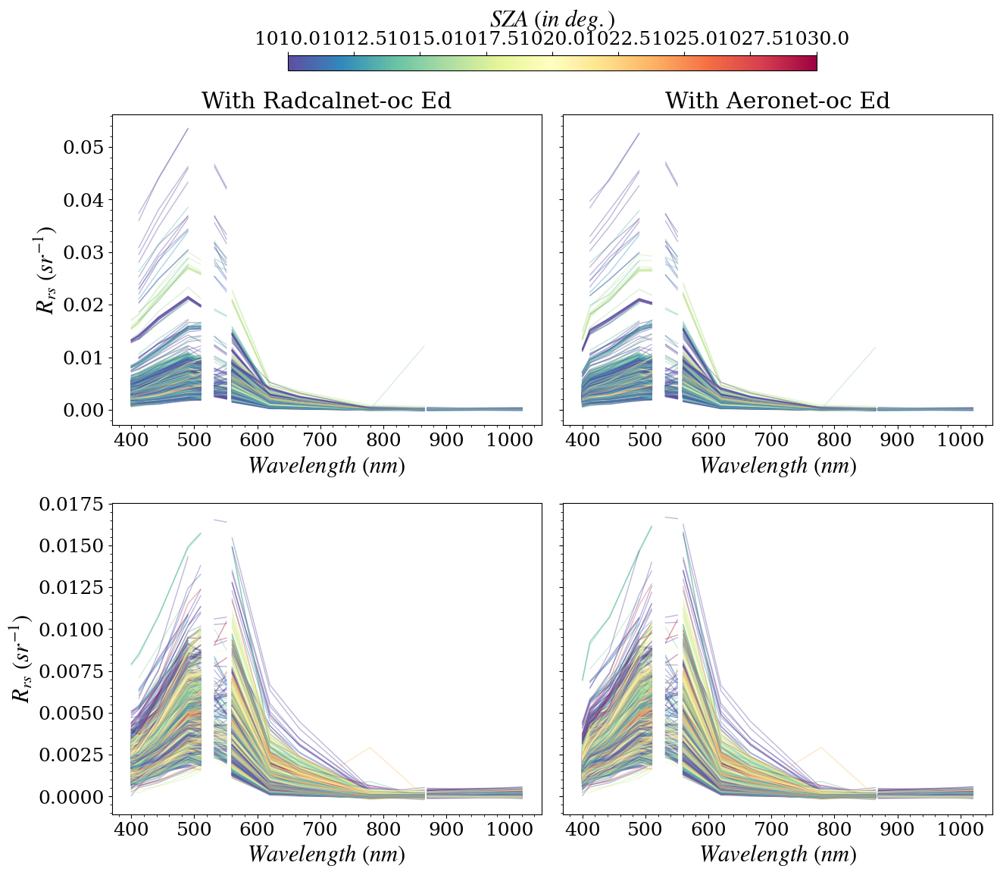

In [30]:
cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=1010, vmax=1030)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

fig,axs = plt.subplots(2,2,figsize=(15,15),sharey='row')#,sharex=True)   
fig.subplots_adjust(hspace=0.25, wspace=0.05)
for sza,group in aeronet_oc_.where(aeronet_oc_.sza<60,drop=True).groupby('sza'):
    ii=1
    if sza <40:
        ii=0
    color=group.pressure.values
    group['Rrs_radoc'].plot(x='wl',color=cmap(norm(color)),lw=1,ls='-',alpha=0.4,ax=axs[ii,0])
    (group['Rrs_Lwn']).plot(x='wl',color=cmap(norm(color)),lw=1,ls='-',alpha=0.4,ax=axs[ii,1])

for ax in  axs.ravel():
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel('')
    ax.set_title('')
    ax.minorticks_on()

axs[0,0].set_title('With Radcalnet-oc Ed')
axs[0,1].set_title('With Aeronet-oc Ed')

axs[0,0].set_ylabel(r'$R_{rs}\ (sr^{-1})$')
axs[1,0].set_ylabel(r'$R_{rs}\ (sr^{-1})$')

cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.05, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)
plt.show()

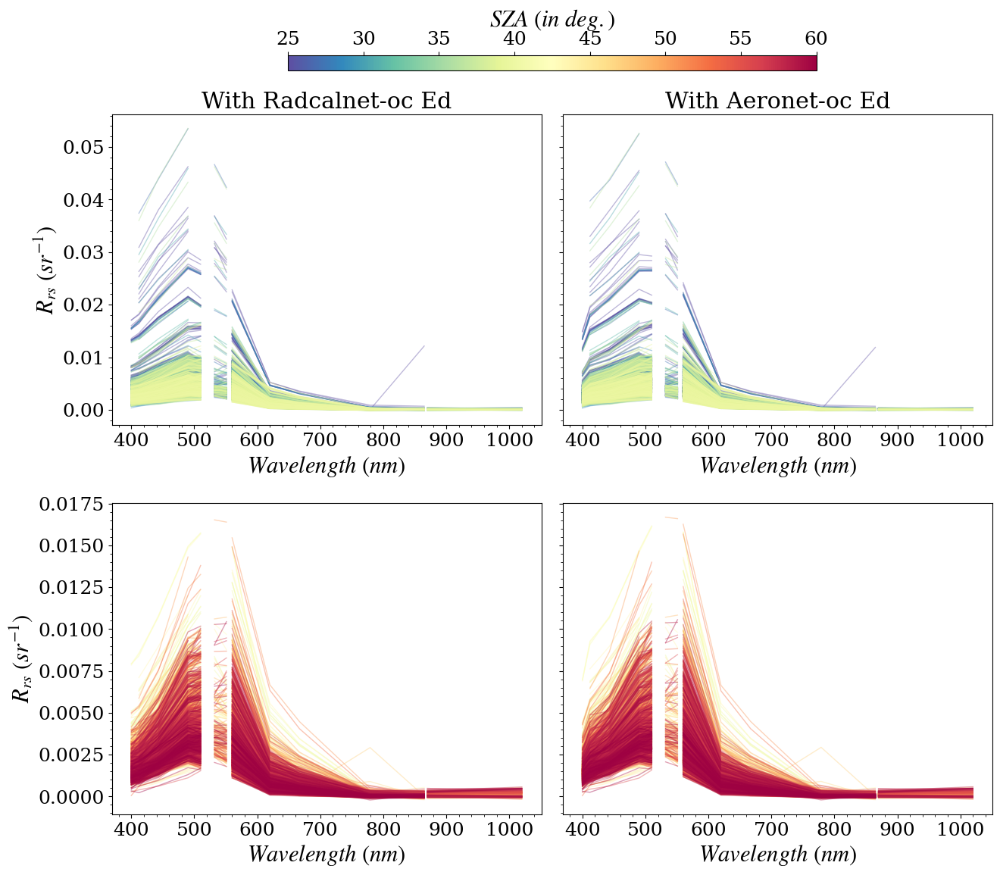

In [31]:
cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=25, vmax=60)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

fig,axs = plt.subplots(2,2,figsize=(15,15),sharey='row')#,sharex=True)   
fig.subplots_adjust(hspace=0.25, wspace=0.05)
for sza,group in aeronet_oc_.where(aeronet_oc_.sza<60,drop=True).groupby('sza'):
    ii=1
    if sza <40:
        ii=0
    group['Rrs_radoc'].plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[ii,0])
    (group['Rrs_Lwn']).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[ii,1])

for ax in  axs.ravel():
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel('')
    ax.set_title('')
    ax.minorticks_on()

axs[0,0].set_title('With Radcalnet-oc Ed')
axs[0,1].set_title('With Aeronet-oc Ed')

axs[0,0].set_ylabel(r'$R_{rs}\ (sr^{-1})$')
axs[1,0].set_ylabel(r'$R_{rs}\ (sr^{-1})$')

cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.05, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)
plt.show()

In [40]:
group['Rrs_radoc'].dropna('wl')

<xarray.DataArray 'Rrs_radoc' (time: 1, wl: 11)> Size: 88B
array([[ 1.47966114e-03,  1.58007733e-03,  1.97061767e-03,
         3.31038951e-03,  3.17926067e-03,  2.78812177e-03,
         5.87469358e-04,  3.38957860e-04,  2.24568742e-05,
        -6.79506646e-06,  1.31063507e-05]])
Coordinates:
  * time     (time) datetime64[ns] 8B 2019-03-28T06:49:35
  * wl       (wl) float64 88B 400.0 412.0 443.0 490.0 ... 779.0 865.0 1.02e+03

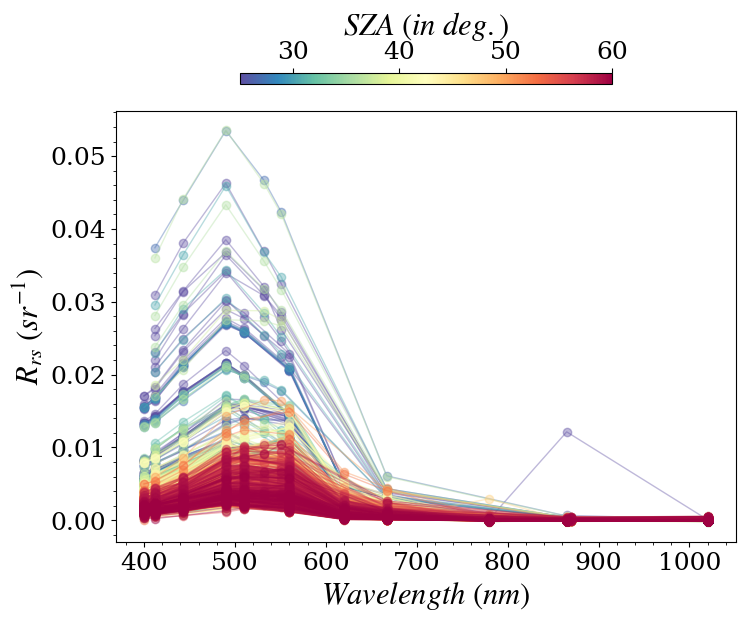

In [41]:
cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=25, vmax=60)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

fig,ax = plt.subplots(1,1,figsize=(8,7),sharey='row')#,sharex=True)   
fig.subplots_adjust(hspace=0.25, wspace=0.05)
for sza,group in aeronet_oc_.where(aeronet_oc_.sza<60,drop=True).groupby('sza'):
    ii=1
    if sza <40:
        ii=0
    group['Rrs_radoc'].dropna('wl').plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',marker='o',alpha=0.4,ax=ax)
    #(group['Rrs_Lwn']).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[ii,1])


ax.set_xlabel(r'$Wavelength\ (nm)$')
ax.set_ylabel('')
ax.set_title('')
ax.minorticks_on()

ax.set_title('')

ax.set_ylabel(r'$R_{rs}\ (sr^{-1})$')

cb = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=35, pad=0.05, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)
plt.show()

In [52]:
group.sza.values[0]

66.83027054545454

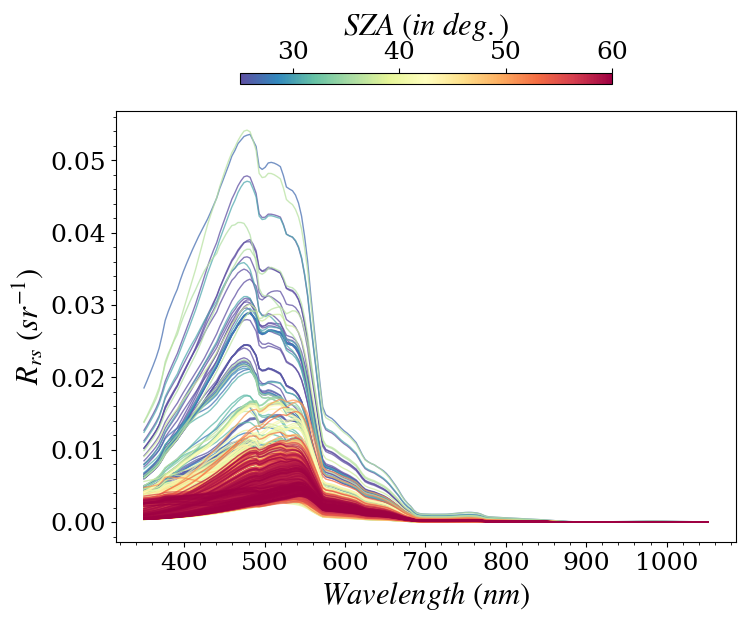

In [48]:
hyp_aeronet_oc = xr.open_mfdataset('/DATA/AERONET/OCv3_invRrs/data/Galata_Platform/lev20/Galata*_lev20_*v2.nc')
dates=aeronet_oc_.where(aeronet_oc_.sza<60,drop=True).time
hyp_aeronet_oc_=hyp_aeronet_oc#.sel(time=dates)
aeronet_oc__ = aeronet_oc_[['tcwv', 'tco3', 'tcno2', 'pressure', 'sza', 'day_of_year', 'aot550', 'aot865', 'ang_exp']]
xtemp= xr.merge([aeronet_oc__,hyp_aeronet_oc_])

cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=25, vmax=60)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

fig,ax = plt.subplots(1,1,figsize=(8,7),sharey='row')#,sharex=True)   
fig.subplots_adjust(hspace=0.25, wspace=0.05)
for sza,group in xtemp.where(aeronet_oc_.sza<60,drop=True).groupby('sza'):
    ii=1
    if sza <40:
        ii=0
    group['Rrs'].plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.74,ax=ax)
    #(group['Rrs_Lwn']).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[ii,1])


ax.set_xlabel(r'$Wavelength\ (nm)$')
ax.set_ylabel('')
ax.set_title('')
ax.minorticks_on()

ax.set_title('')

ax.set_ylabel(r'$R_{rs}\ (sr^{-1})$')

cb = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=35, pad=0.05, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)
plt.show()

In [44]:
aeronet_oc_

<xarray.Dataset> Size: 23MB
Dimensions:                       (time: 7586, wl: 14)
Coordinates:
  * time                          (time) datetime64[ns] 61kB 2017-01-02T08:22...
  * wl                            (wl) float64 112B 400.0 412.0 ... 1.02e+03
Data variables: (12/55)
    Aerosol_Optical_Depth         (time, wl) float64 850kB nan ... 0.03571
    wavelength                    (time, wl) float64 850kB nan 0.4125 ... 1.02
    Li_mean                       (time, wl) float64 850kB nan 4.85 ... 0.1512
    Li_stddev                     (time, wl) float64 850kB nan ... 0.00021
    Lt_mean                       (time, wl) float64 850kB nan ... 0.00615
    Lt_min_rel                    (time, wl) float64 850kB nan ... 0.004902
    ...                            ...
    sza                           (time) float64 61kB 70.36 68.79 ... 66.83
    day_of_year                   (time) int64 61kB 2 2 2 3 3 ... 360 360 1 1
    aot550                        (time) float64 61kB 0.02895 0.0293 ... 0.05071
    aot865                        (time) float64 61kB 0.02277 ... 0.03637
    ang_exp                       (time) float64 61kB 0.5304 0.4027 ... 0.7339
    Rrs_radoc                     (time, wl) float64 850kB nan ... 2.417e-05

In [45]:
radoc_process.get_downwelling_irradiance(aerosol_combination=[0, 0.5, 0.5, 0., 0.0])
Ed = radoc_process.Ed
Ed.sel(time=xtemp.time)

<xarray.DataArray (time: 7586, wl: 21532)> Size: 1GB
array([[2.18908966e+02, 2.07282579e+02, 2.61291984e+02, ...,
        1.18107378e-01, 7.08373155e-02, 1.37887737e+00],
       [2.42520408e+02, 2.29629789e+02, 2.89451083e+02, ...,
        1.41877053e-01, 8.60518879e-02, 1.56990443e+00],
       [2.80717112e+02, 2.65779412e+02, 3.34999855e+02, ...,
        2.89750549e-01, 1.87105037e-01, 2.37810649e+00],
       ...,
       [2.73426807e+02, 2.58875865e+02, 3.26296562e+02, ...,
        6.34775759e-02, 3.51108310e-02, 1.08946380e+00],
       [2.73302831e+02, 2.58759230e+02, 3.26150570e+02, ...,
        1.91657130e-02, 9.37135165e-03, 5.91492032e-01],
       [2.68870017e+02, 2.54564213e+02, 3.20865088e+02, ...,
        1.72813813e-02, 8.37098863e-03, 5.57756905e-01]])
Coordinates:
  * time     (time) datetime64[ns] 61kB 2017-01-02T08:22:55 ... 2023-01-01T10...
  * wl       (wl) float64 172kB 350.1 350.3 350.5 ... 2.499e+03 2.5e+03
    sza      (time) float64 61kB 70.36 68.79 66.35 70.27 ... 66.56 66.53 66.83
    aot_ref  (time) float64 61kB 0.02895 0.0293 0.02275 ... 0.05152 0.05071

In [46]:
xtemp

<xarray.Dataset> Size: 25MB
Dimensions:      (time: 7586, wl: 200)
Coordinates:
  * time         (time) datetime64[ns] 61kB 2017-01-02T08:22:55 ... 2023-01-0...
  * wl           (wl) float64 2kB 350.0 353.8 357.5 ... 1.096e+03 1.1e+03
Data variables:
    tcwv         (time) float64 61kB 7.243 7.631 7.406 ... 9.934 12.01 12.02
    tco3         (time) float64 61kB 0.007067 0.007068 ... 0.007053 0.007053
    tcno2        (time) float64 61kB 4.169e-06 4.169e-06 ... 4.17e-06 4.17e-06
    pressure     (time) float64 61kB 1.016e+03 1.016e+03 ... 1.027e+03 1.027e+03
    sza          (time) float64 61kB 70.36 68.79 66.35 ... 66.56 66.53 66.83
    day_of_year  (time) int64 61kB 2 2 2 3 3 3 12 12 ... 353 359 359 360 360 1 1
    aot550       (time) float64 61kB 0.02895 0.0293 0.02275 ... 0.05152 0.05071
    aot865       (time) float64 61kB 0.02277 0.02442 0.02123 ... 0.03719 0.03637
    ang_exp      (time) float64 61kB 0.5304 0.4027 0.1528 ... 0.7202 0.7339
    Rrs          (time, wl) float64 12MB dask.array<chunksize=(90, 200), meta=np.ndarray>
    Rrs_nadir    (time, wl) float64 12MB dask.array<chunksize=(90, 200), meta=np.ndarray>

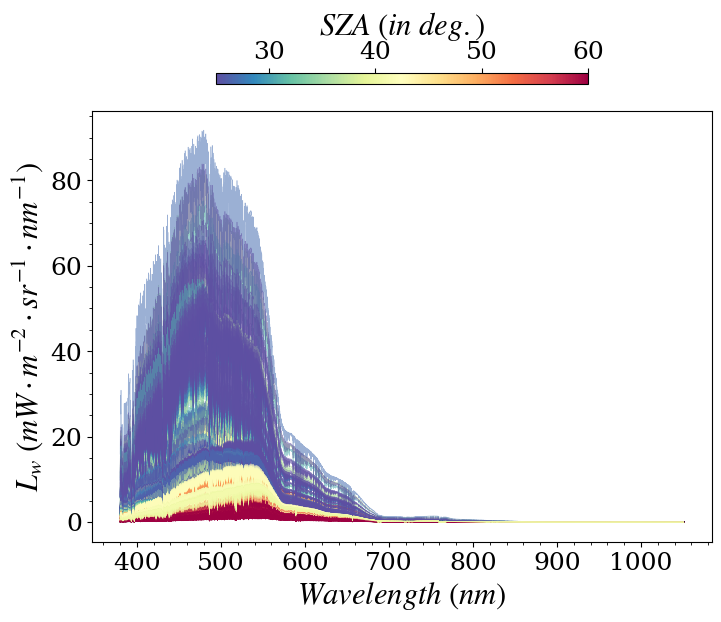

In [53]:



cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=25, vmax=60)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

fig,ax = plt.subplots(1,1,figsize=(8,7),sharey='row')#,sharex=True)   
fig.subplots_adjust(hspace=0.25, wspace=0.05)
for date,group in xtemp.groupby('time'):
    ii=1
    sza = group.sza.values[0]
    if sza <40:
        ii=0
    Ed_=Ed.sel(time=group.time.values).sel(wl=slice(380,1100))    
    (group['Rrs'].interp(wl=Ed_.wl.values)*Ed_).plot(x='wl',color=cmap(norm(sza)),lw=0.4,ls='-',alpha=0.54,ax=ax)
    #(group['Rrs_Lwn']).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[ii,1])


ax.set_xlabel(r'$Wavelength\ (nm)$')
ax.set_ylabel('')
ax.set_title('')
ax.minorticks_on()

ax.set_title('')

ax.set_ylabel(r'$L_{w}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
cb = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=35, pad=0.05, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)
plt.show()

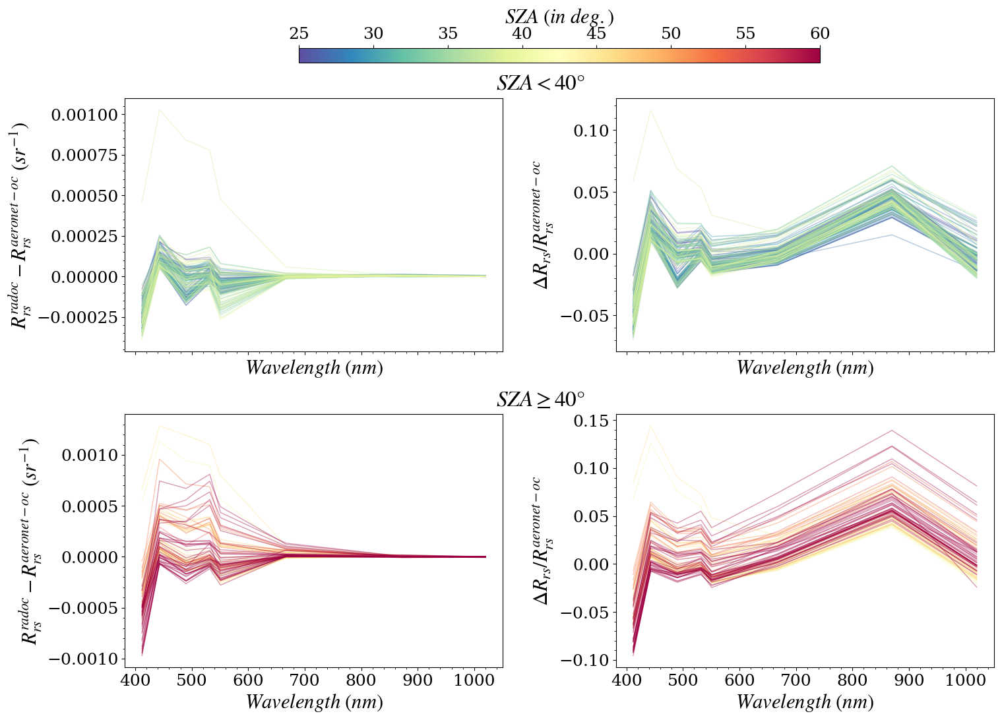

In [16]:
cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=25, vmax=60)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)


aeronet_oc_['delta_Rrs']=(aeronet_oc_['Rrs_radoc']-aeronet_oc_['Rrs_Lwn'])
aeronet_oc_['delta_rel_Rrs']=aeronet_oc_['delta_Rrs']/aeronet_oc_['Rrs_Lwn']




fig,axs = plt.subplots(2,2,figsize=(17,14),sharex=True)   
fig.subplots_adjust(hspace=0.25, wspace=0.3)
for sza,group in aeronet_oc_.where(aeronet_oc_.sza<65,drop=True).groupby('sza'):
    ii=1
    if sza <40:
        ii=0
    group['delta_Rrs'].plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[ii,0])
    (group['delta_rel_Rrs']).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[ii,1])
    
for ax in  axs.ravel():
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel('')
    ax.set_title('')
    ax.minorticks_on() 
for ii in range(2):
    axs[ii,0].set_ylabel(r'$R_{rs}^{radoc}-R_{rs}^{aeronet-oc}\ (sr^{-1})$')
    axs[ii,1].set_ylabel(r'$\Delta R_{rs}/R_{rs}^{aeronet-oc}$')
ax=axs[0,0]
ax.text(1.1, 1.1, r'$SZA <40\degree$', fontsize=24, verticalalignment='top', horizontalalignment='center',
                transform=ax.transAxes)
ax=axs[1,0]
ax.text(1.1, 1.1, r'$SZA \geq40\degree$', fontsize=24, verticalalignment='top', horizontalalignment='center',
                transform=ax.transAxes)
cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.05, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)
plt.show()

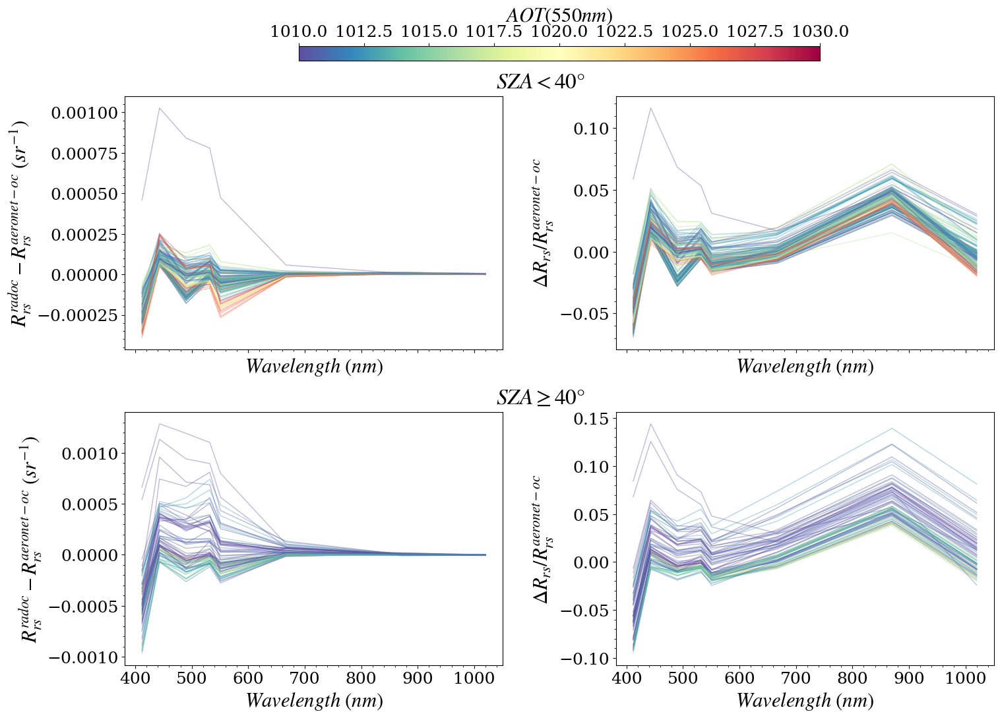

In [18]:
cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=0, vmax=0.5)
norm = mpl.colors.Normalize(vmin=1010, vmax=1030)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)






fig,axs = plt.subplots(2,2,figsize=(17,14),sharex=True)   
fig.subplots_adjust(hspace=0.25, wspace=0.3)
for sza,group in aeronet_oc_.where(aeronet_oc_.sza<65,drop=True).groupby('sza'):
    ii=1
    if sza <40:
        ii=0
    color=group.aot550.values
    color=group.pressure.values
    group['delta_Rrs'].plot(x='wl',color=cmap(norm(color)),lw=1,ls='-',alpha=0.4,ax=axs[ii,0])
    (group['delta_rel_Rrs']).plot(x='wl',color=cmap(norm(color)),lw=1,ls='-',alpha=0.4,ax=axs[ii,1])
    
for ax in  axs.ravel():
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel('')
    ax.set_title('')
    ax.minorticks_on() 
for ii in range(2):
    axs[ii,0].set_ylabel(r'$R_{rs}^{radoc}-R_{rs}^{aeronet-oc}\ (sr^{-1})$')
    axs[ii,1].set_ylabel(r'$\Delta R_{rs}/R_{rs}^{aeronet-oc}$')
ax=axs[0,0]
ax.text(1.1, 1.1, r'$SZA <40\degree$', fontsize=24, verticalalignment='top', horizontalalignment='center',
                transform=ax.transAxes)
ax=axs[1,0]
ax.text(1.1, 1.1, r'$SZA \geq40\degree$', fontsize=24, verticalalignment='top', horizontalalignment='center',
                transform=ax.transAxes)
cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.05, location='top')
cb.set_label(r'$AOT(550nm)$', fontsize=22)
plt.show()

In [22]:
owt_file = '/DATA/projet/vrac/owt/Spyrakos_et_al_2018_OWT_inland_mean_standardised.csv'
owt =pd.read_csv(owt_file,index_col=0).stack().to_xarray()
owt = owt.rename({'level_1':'wl'})
owt['wl']=owt.wl.astype(float)
owt

<xarray.DataArray (owt: 13, wl: 401)> Size: 42kB
array([[0.000941, 0.000931, 0.000921, ..., 0.00684 , 0.00686 , 0.00689 ],
       [0.00126 , 0.00126 , 0.00126 , ..., 0.000645, 0.000654, 0.000662],
       [0.00276 , 0.00277 , 0.00278 , ..., 0.000267, 0.000271, 0.000276],
       ...,
       [0.000785, 0.000779, 0.000773, ..., 0.00147 , 0.00149 , 0.00152 ],
       [0.00168 , 0.00168 , 0.00167 , ..., 0.00134 , 0.00136 , 0.00137 ],
       [0.00959 , 0.00957 , 0.00954 , ..., 0.000179, 0.000186, 0.000194]])
Coordinates:
  * owt      (owt) int64 104B 1 2 3 4 5 6 7 8 9 10 11 12 13
  * wl       (wl) float64 3kB 400.0 401.0 402.0 403.0 ... 798.0 799.0 800.0

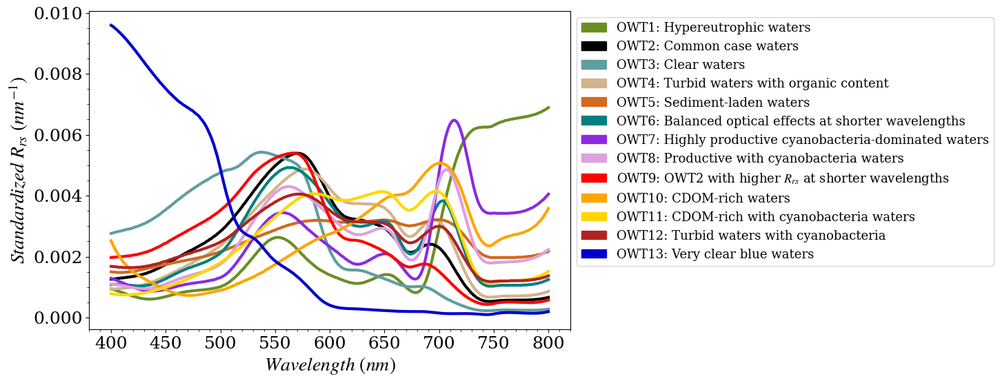

In [25]:

import matplotlib.patches as mpatches

owt_info={
        1:dict(color='olivedrab',label='OWT1: Hypereutrophic waters'),
        2:dict(color='black',label='OWT2: Common case waters'),
        3:dict(color='cadetblue',label='OWT3: Clear waters'),
        4:dict(color='tan',label='OWT4: Turbid waters with organic content'),
        5:dict(color='chocolate',label='OWT5: Sediment-laden waters'),
        6:dict(color='teal',label='OWT6: Balanced optical effects at shorter wavelengths'),
        7:dict(color='blueviolet',label='OWT7: Highly productive cyanobacteria-dominated waters'),
        8:dict(color='plum',label='OWT8: Productive with cyanobacteria waters'),
        9:dict(color='red',label='OWT9: OWT2 with higher $R_{rs}$ at shorter wavelengths'),#'slategrey'
        10:dict(color='orange',label='OWT10: CDOM-rich waters'),
        11:dict(color='gold',label='OWT11: CDOM-rich with cyanobacteria waters'),
        12:dict(color='firebrick',label='OWT12: Turbid waters with cyanobacteria'),
        13:dict(color='mediumblue',label='OWT13: Very clear blue waters'),
        }
colors = ['olivedrab','orange','cadetblue','tan','chocolate','teal','blueviolet','forestgreen','gold','firebrick','slategrey','seagreen','mediumblue']
cmap = mpl.colors.ListedColormap(colors)

patch = []
for key,info in owt_info.items():
    patch.append(mpatches.Patch(color=info['color'], label=info['label']))

fig, ax = plt.subplots(nrows=1,ncols=1, sharex=True,figsize=(9, 6))
ax.minorticks_on()
for iowt,group in owt.groupby('owt'):
    
    group.plot(color=owt_info[iowt]['color'],lw=3)
ax.set_title('' )
ax.set_ylabel(r'$Standardized\ R_{rs}\ (nm^{-1})$',fontsize=20)
ax.set_xlabel(r'$Wavelength\ (nm)$',fontsize=20)    
plt.legend(handles=patch,fontsize=13,bbox_to_anchor=(1, .5, 0.5, 0.5))
#plt.savefig(opj(figdir,'sRrs_owt_fig.png'),dpi=300, bbox_inches='tight')

In [26]:
def SAM(R1,R2):
    denum=(R1*R2).sum('wl')
    denom = (R1**2).sum('wl')**0.5 * (R2**2).sum('wl')**0.5
    return np.arccos(denum/denom)

def SCS(R1,R2):
    R1_avg = R1.mean('wl')
    R2_avg = R2.mean('wl')
    R1_std = R1.std('wl')
    R2_std = R2.std('wl')
    Nwl = len(R1.wl)
    return 1/(Nwl) * ((R1-R1_avg) * (R2-R2_avg)).sum('wl') / (R1_std*R2_std)
    

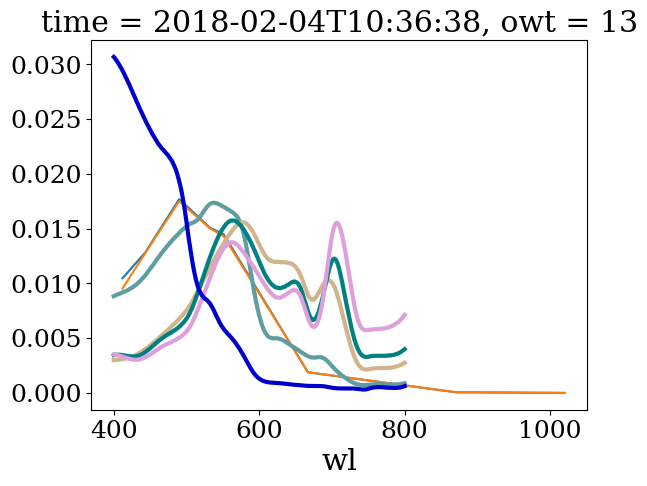

In [61]:
aeronet_oc_['Rrs_Lwn'].isel(time=0).plot()
aeronet_oc_['Rrs_radoc'].isel(time=0).plot()
scale_factor = aeronet_oc_['Rrs_Lwn'].isel(time=0).integrate("wl")
for iowt in [3,4,6,8,13]:
    (scale_factor*owt.sel(owt=iowt)).plot(color=owt_info[iowt]['color'],lw=3)

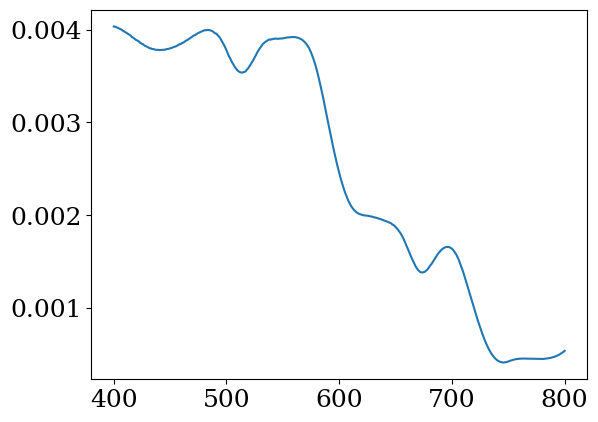

In [65]:
def Rrs_sim(alpha,Rrs_ref):
    Nowt = len(alpha)
    Rrs_sim =0
    for ii in range(Nowt):
        Rrs_sim += alpha[ii]*Rrs_ref[ii]
    return Rrs_sim    

def func(alpha,Rrs_data,Rrs_ref):
    Nowt = 4
    
    for ii in range(Nowt):
        Rrs_sim += alpha*Rrs_ref[ii]
    return Rrs_data - Rrs_sim

    
Rrs_owt = owt.sel(owt=[3,4,6,13]).values
alpha= np.array([0.5,0.5,0.2,0.5])
norm = np.sum(alpha)
plt.plot(owt.wl,Rrs_sim(alpha,Rrs_owt)/norm)

In [57]:
scale_factor

<xarray.DataArray 'Rrs_Lwn' ()> Size: 8B
array(3.19866409)
Coordinates:
    time     datetime64[ns] 8B 2018-02-04T10:36:38

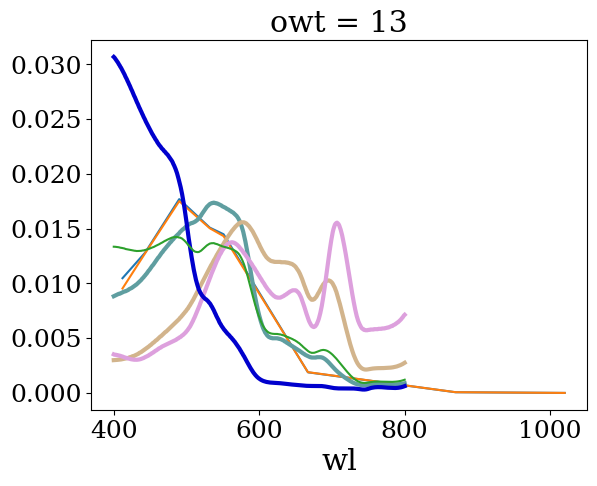

In [67]:
aeronet_oc_['Rrs_Lwn'].isel(time=0).plot()
aeronet_oc_['Rrs_radoc'].isel(time=0).plot()
scale_factor = float(aeronet_oc_['Rrs_Lwn'].isel(time=0).integrate("wl"))
for iowt in [3,4,8,13]:
    (scale_factor*owt.sel(owt=iowt)).plot(color=owt_info[iowt]['color'],lw=3)
alpha= np.array([0.5,0.2,0,0.25])
norm = np.sum(alpha)
plt.plot(owt.wl,Rrs_sim(alpha,scale_factor*Rrs_owt)/norm)

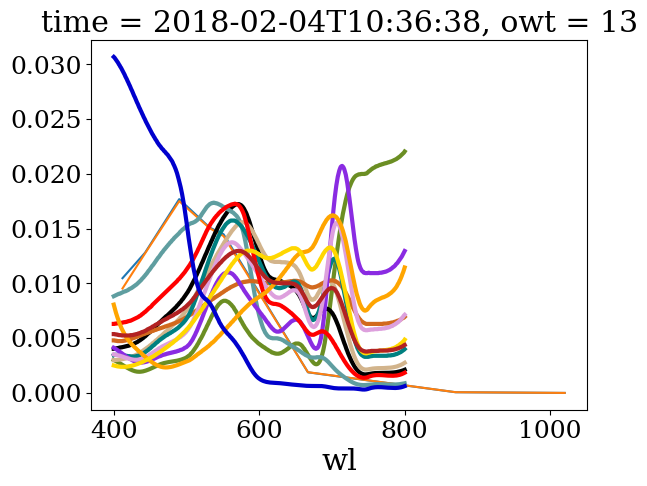

In [40]:
aeronet_oc_['Rrs_Lwn'].isel(time=0).plot()
aeronet_oc_['Rrs_radoc'].isel(time=0).plot()
scale_factor = aeronet_oc_['Rrs_Lwn'].isel(time=0).integrate("wl")
for iowt in range(1,14):
    (scale_factor*owt.sel(owt=iowt)).plot(color=owt_info[iowt]['color'],lw=3)

In [29]:

Rrs_data = aeronet_oc_['Rrs_Lwn']

Rrs_owt = owt.interp(wl=Rrs_data.wl)

owt_sam = SAM(Rrs_data,Rrs_owt)
owt_scs =SCS(Rrs_data,Rrs_owt)

owt_delta = owt_scs + (1-2*owt_sam/np.pi)/2

/tmp/ipykernel_3695562/2562403812.py:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize=10)


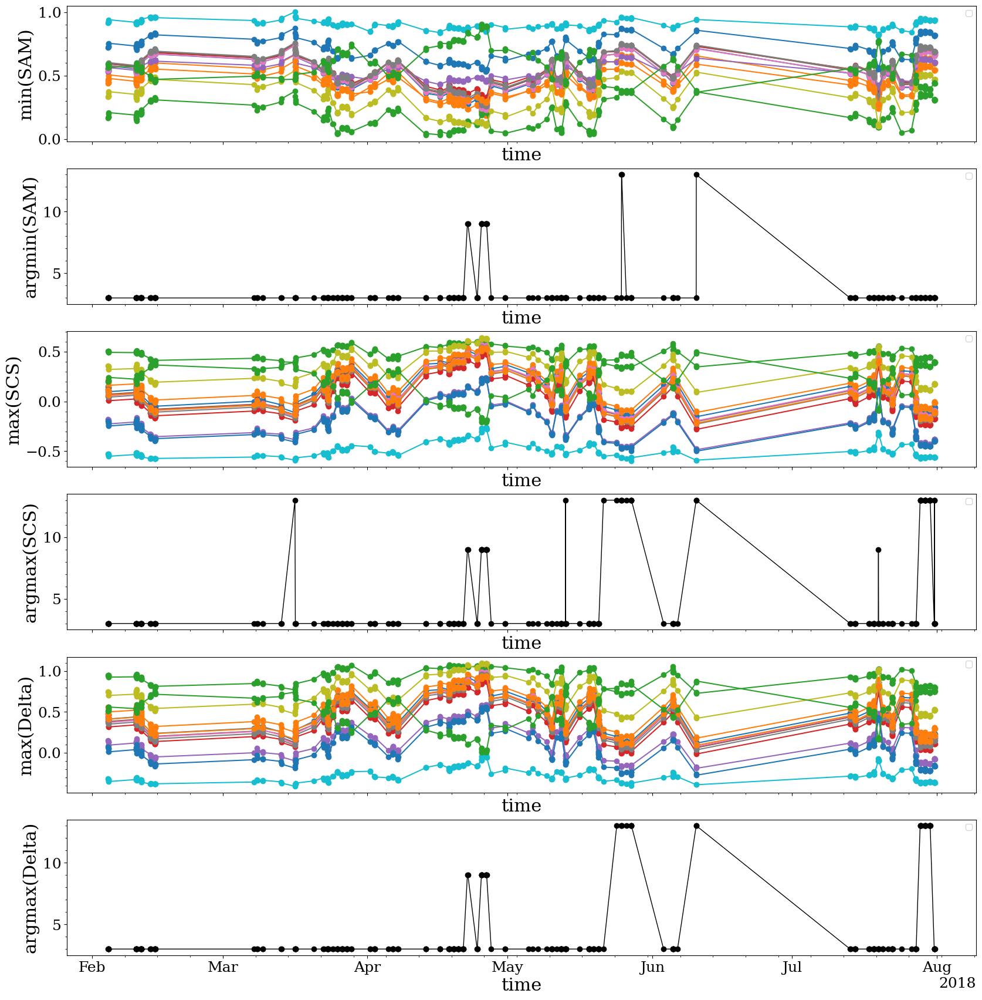

In [30]:
labels = ['min(SAM)','argmin(SAM)','max(SCS)','argmax(SCS)','max(Delta)','argmax(Delta)']
fig, axs = plt.subplots(nrows=6,ncols=1, sharex=True, figsize=(20, 6*3.5))#,
owt_sam.plot(hue='owt',marker='o',ax=axs[0])
(owt_sam.argmin('owt')+1).plot(marker='o',color='black',lw=1,ax=axs[1])
owt_scs.plot(hue='owt',marker='o',ax=axs[2])
(owt_scs.argmax('owt')+1).plot(marker='o',color='black',lw=1,ax=axs[3])
owt_delta.plot(hue='owt',marker='o',ax=axs[4])
(owt_delta.argmax('owt')+1).plot(marker='o',color='black',lw=1,ax=axs[5])

for iax,ax in enumerate(axs):
    ax.legend(fontsize=10)
    ax.set_title('')
    ax.minorticks_on()
    ax.set_ylabel(labels[iax])

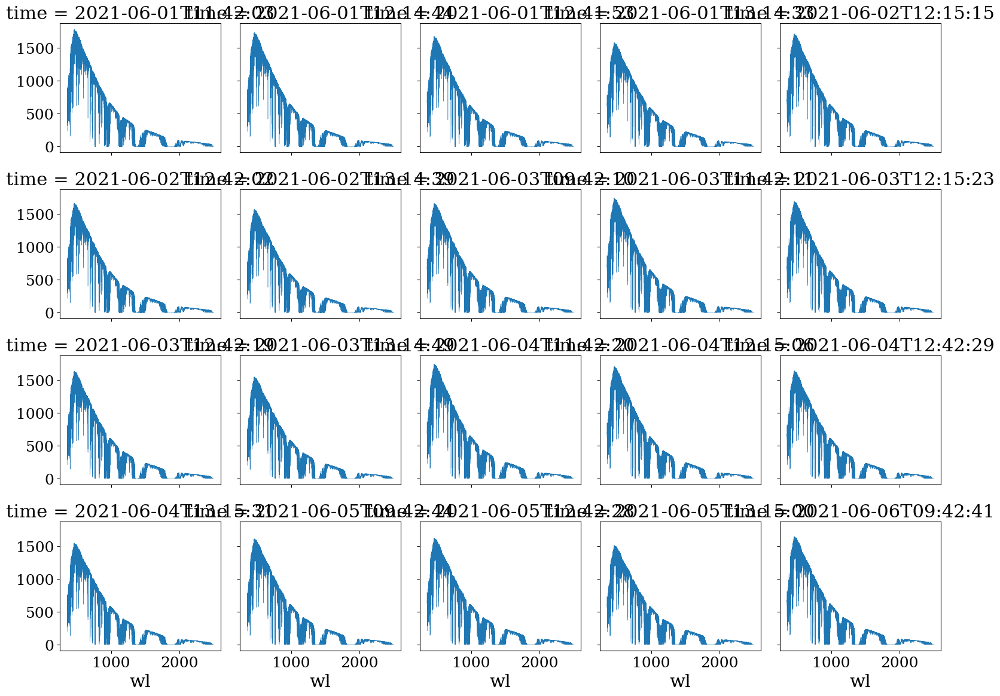

In [37]:
radoc_process.Ed.isel(time=slice(0,20)).plot(col='time',col_wrap=5,lw=0.3)

In [38]:
Ed = radoc_process.Ed
fwhm=15
central_wl = aeronet_oc.wavelength.mean('time')*1000
spectral=radoc.Spectral(central_wl,fwhm)
Ed_int = spectral.convolve(Ed)
Ed_int['sza']=Ed.sza
Ed_int['wl']=aeronet_oc.wl
Ed_int=Ed_int.squeeze()

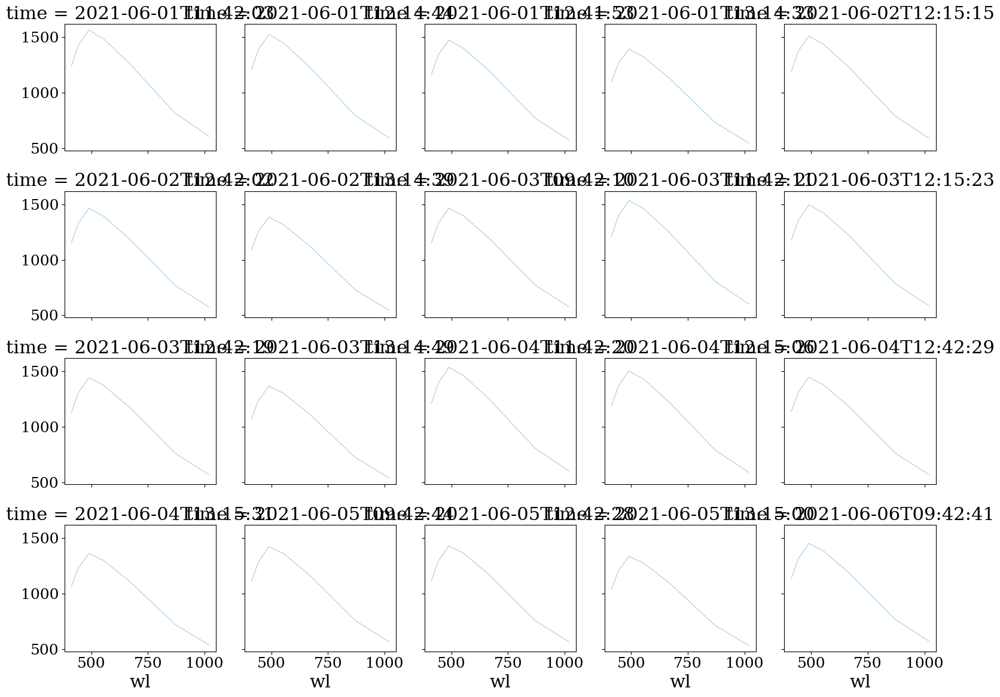

In [40]:
Ed_int.isel(time=slice(0,20)).plot(col='time',col_wrap=5,lw=0.3)

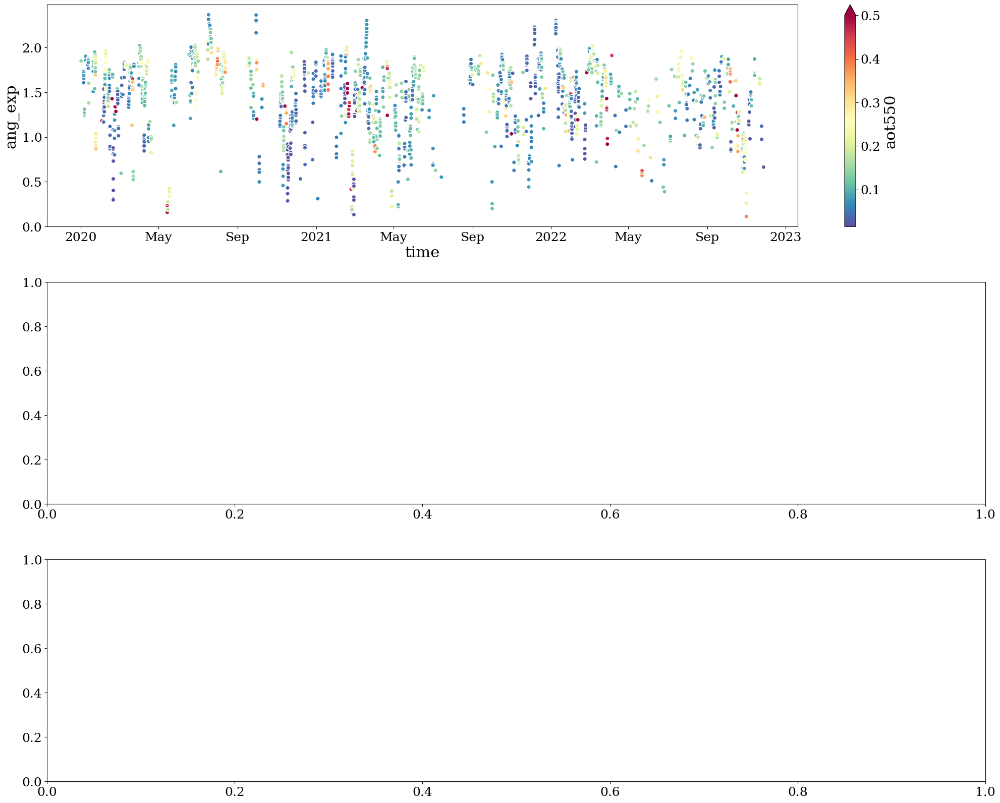

In [8]:
fig, axs = plt.subplots(ncols=1,nrows=3, figsize=(24, 20))
fig.subplots_adjust(hspace=0.25, wspace=0.25)
ax=axs[0]
aeronet_oc.sel(time=slice('2020','2022')).plot.scatter(x="time", y="ang_exp", hue="aot550",vmax=0.5,cmap=plt.cm.Spectral_r,ax=ax)

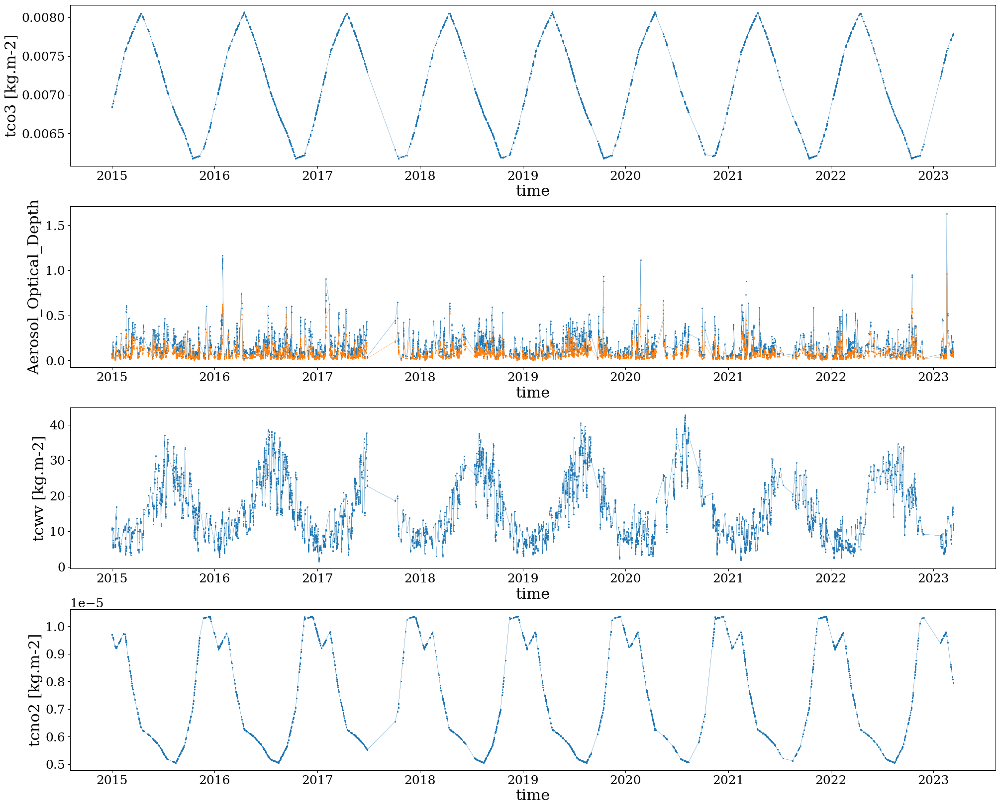

In [9]:
fig, axs = plt.subplots(ncols=1,nrows=4, figsize=(24, 20))
fig.subplots_adjust(hspace=0.25, wspace=0.25)
aeronet_oc['tco3'].plot(marker="o",ms=1,lw=0.3,ax=axs[0])
aeronet_oc.Aerosol_Optical_Depth.sel(wl=550,method='nearest').plot(marker="o",ms=1,lw=0.3,ax=axs[1])
aeronet_oc.Aerosol_Optical_Depth.sel(wl=865,method='nearest').plot(marker="o",ms=1,lw=0.3,ax=axs[1])

aeronet_oc['tcwv'].plot(marker="o",ms=1,lw=0.3,ax=axs[2])
aeronet_oc['tcno2'].plot(marker="o",ms=1,lw=0.3,ax=axs[3])
#dc.datacube.mean_solar_azimuth.plot()
for ax in axs:
    ax.set_title('')

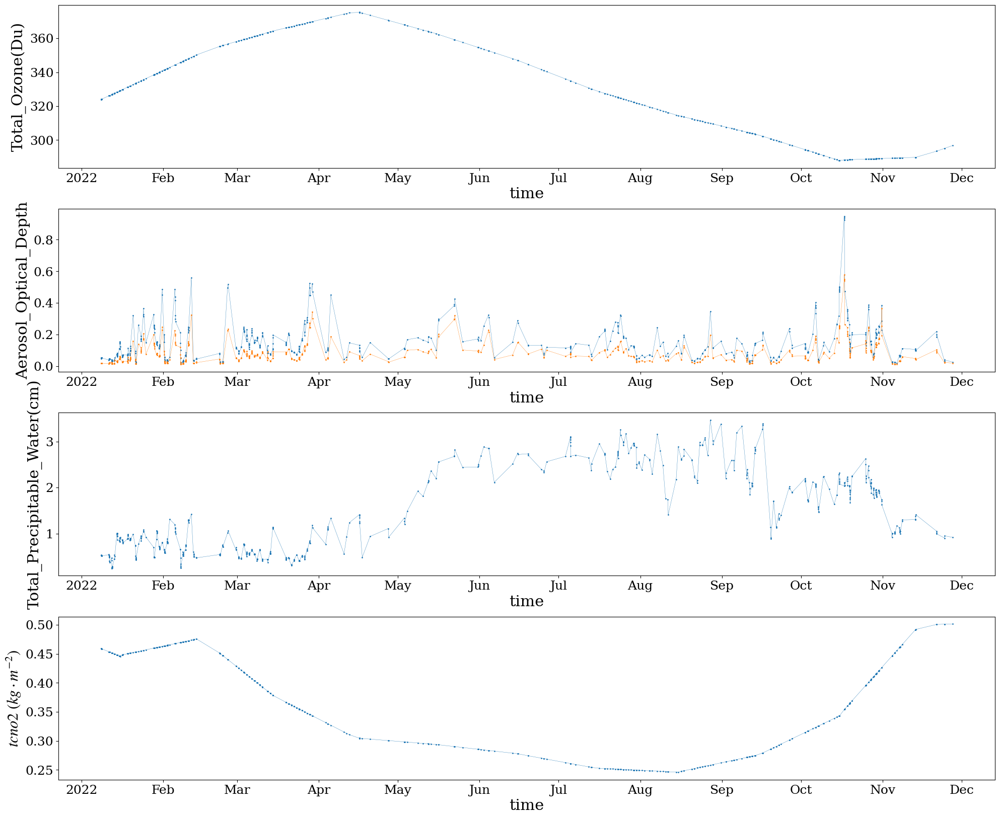

In [10]:
aeronet_oc_ = aeronet_oc.sel(time='2022')
fig, axs = plt.subplots(ncols=1,nrows=4, figsize=(24, 20))
fig.subplots_adjust(hspace=0.25, wspace=0.25)
aeronet_oc_['Total_Ozone(Du)'].plot(marker="o",ms=1,lw=0.3,ax=axs[0])
aeronet_oc_.Aerosol_Optical_Depth.sel(wl=550,method='nearest').plot(marker="o",ms=1,lw=0.3,ax=axs[1])
aeronet_oc_.Aerosol_Optical_Depth.sel(wl=865,method='nearest').plot(marker="o",ms=1,lw=0.3,ax=axs[1])

aeronet_oc_['Total_Precipitable_Water(cm)'].plot(marker="o",ms=1,lw=0.3,ax=axs[2])
#(aeronet_oc_['Total_NO2(DU)']*4.6e-8).plot(marker="o",ms=1,lw=0.3,ax=axs[3])
(aeronet_oc_['Total_NO2(DU)']).plot(marker="o",ms=1,lw=0.3,ax=axs[3])

#axs[3].set_ylabel(r'$tcno2\ (kg\cdot m^{-2})$')
axs[3].set_ylabel(r'$tcno2\ (kg\cdot m^{-2})$')
#dc.datacube.mean_solar_azimuth.plot()
for ax in axs:
    ax.set_title('')

In [8]:
aeronet_oc_daily = aeronet_oc.sel(time='2022-03-10').mean('time')
aeronet_oc_daily

<xarray.Dataset> Size: 2kB
Dimensions:                       (wl: 8)
Coordinates:
  * wl                            (wl) float64 64B 412.0 443.0 ... 1.02e+03
Data variables: (12/44)
    Aerosol_Optical_Depth         (wl) float64 64B 0.2897 0.27 ... 0.06432
    wavelength                    (wl) float64 64B 0.4113 0.442 ... 0.8694 1.017
    Li_mean                       (wl) float64 64B 6.488 6.131 ... 0.8147 0.4081
    Li_stddev                     (wl) float64 64B 0.001389 ... 0.001286
    Lt_mean                       (wl) float64 64B 0.5646 0.7546 ... 0.01541
    Lt_min_rel                    (wl) float64 64B 0.5516 0.7464 ... 0.014
    ...                            ...
    Rrs_Lwn_IOP                   (wl) float64 64B 0.007013 ... 9.422e-05
    Rrs_Lwn_fQ                    (wl) float64 64B 0.007458 ... 9.422e-05
    tcwv                          float64 8B 4.245
    tco3                          float64 8B 0.007776
    tcno2                         float64 8B 8.076e-06
    aot550                        float64 8B 0.2017

In [27]:
lut.gas_lut

<xarray.Dataset> Size: 2MB
Dimensions:  (wl: 21687)
Coordinates:
  * wl       (wl) float64 173kB 349.9 350.1 350.3 ... 2.599e+03 2.6e+03
Data variables:
    ch4      (wl) float64 173kB 0.0 0.0 0.0 0.0 ... 0.3026 0.0456 0.8562 0.5417
    co       (wl) float64 173kB ...
    co2      (wl) float64 173kB 0.0 0.0 0.0 ... 0.0006887 0.0007286 0.0004579
    h2o      (wl) float64 173kB ...
    n2o      (wl) float64 173kB ...
    no2      (wl) float64 173kB ...
    o2       (wl) float64 173kB 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    o3       (wl) float64 173kB ...
    o4       (wl) float64 173kB 1.971e-06 1.35e-06 9.23e-07 ... 0.0 0.0 0.0
Attributes:
    description:           Absorption optical thickness of some atmospheric g...
    atmospheric pressure:  1000 hPa

In [9]:
central_wl = aeronet_oc.wavelength*1000
lut= radoc.LUT()
full_wl = lut.gas_lut.wl.sel(wl=slice(350,2500))

lut= radoc.LUT(wl=full_wl)

lut.load_auxiliary_data()
solar_irr=radoc.SolarIrradiance()

F0 = solar_irr.tsis.interp(wl=full_wl)
gas_trans = radoc.GaseousTransmittance(lut.gas_lut)

lut_Ttot_Ed=lut.trans_lut.Ttot_Ed.isel(wind=1,model=1)

# sensor convolution
fwhm=3
central_wl = np.arange(350, 2500, 1)
spectral=radoc.Spectral(central_wl,fwhm)

F0

<xarray.DataArray 'SSI' (wl: 21532)> Size: 172kB
array([1175.52077285, 1111.75133094, 1399.88129928, ...,   50.94393374,
         51.11027174,   51.11674067])
Coordinates:
  * wl       (wl) float64 172kB 350.1 350.3 350.5 ... 2.499e+03 2.5e+03
Attributes:
    units:      mW m-2 nm-1
    long_name:  Solar Spectral Irradiance Reference Spectrum (mW m-2 nm-1)
    reference:  Coddington, O. M., Richard, E. C., Harber, D., et al. (2021)....

NameError: name 'lut_Ttot_Ed' is not defined

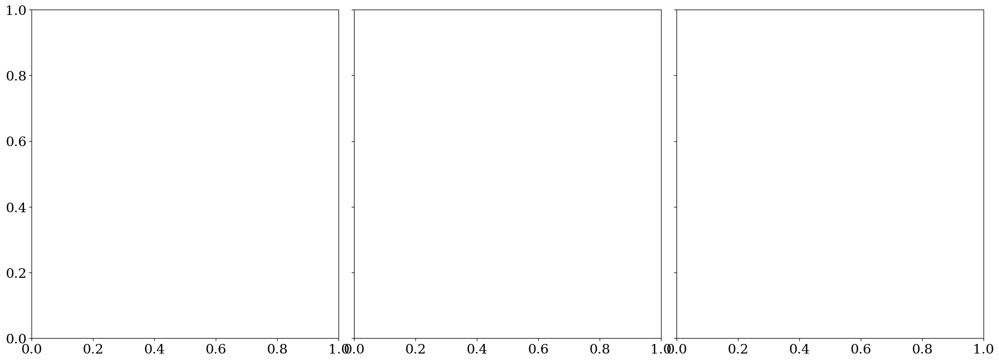

In [15]:

cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=35, vmax=70)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
fig,axs = plt.subplots(1,3,figsize=(23,8),sharey=True,sharex=True)   
fig.subplots_adjust(hspace=0.05, wspace=0.05)

date='2022-08'
aeronet_oc_=aeronet_oc.sel(time=date)
sza=aeronet_oc_.SZA
mu0 = np.cos(np.radians(sza))

aot550 = aeronet_oc_.aot550


gas_trans.air_mass=1./mu0
gas_trans.gas_tc['h2o'] = aeronet_oc_.tcwv
gas_trans.pressure=aeronet_oc_['Pressure(hPa)']
#gas_trans.gas_tc['h2o'] = tcwv
gas_trans.gas_tc['o3'] = aeronet_oc_['tco3']
#gas_trans.gas_tc['ch4'] = tcch4
gas_trans.gas_tc['no2'] = aeronet_oc_['tcno2']

Tg_d=gas_trans.get_gaseous_transmittance()

#Tra_d = lut_Ttot_Ed.interp(sza=sza).interp(aot_ref=aot550,method='quadratic').interp(wl=full_wl,method='quadratic')
#lut.lut_preparation(sza=[sza])
Tra_d =lut_Ttot_Ed.interp(sza=sza,aot_ref=aot550).interp(wl=full_wl,method='quadratic')

Ed=Tra_d*Tg_d*mu0*F0
Ed=Ed.dropna('wl')

for sza,Ed_ in Ed.groupby('sza'):
    Ed_.plot(x='wl',color=cmap(norm(sza)),lw=0.3,ls='-',ax=axs[0])
axs[0].set_title(r'Full resolution (0.1 nm)') 

fwhm=3
central_wl = np.arange(350, 2500, 1)
spectral=radoc.Spectral(central_wl,fwhm)
Ed_int = spectral.convolve(Ed)
Ed_int['sza']=Ed.sza

for sza,Ed_ in Ed_int.groupby('sza'):
    Ed_.plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',ax=axs[1])
axs[1].set_title(r'FWHM='+str(fwhm)+r'nm') 

fwhm=15
central_wl = aeronet_oc.wavelength.mean('time')*1000
spectral=radoc.Spectral(central_wl,fwhm)
Ed_int = spectral.convolve(Ed)
Ed_int['sza']=Ed.sza

for sza,Ed_ in Ed_int.groupby('sza'):
    Ed_.plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',ax=axs[2])
axs[2].set_title('AERONET-OC like')  

for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    
    ax.minorticks_on() 
    
axs[0].set_ylabel(r'$E_d\ (mW\cdot m^{-2}\cdot nm^{-1})$')
cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)

Ed_int['wl']=aeronet_oc.wl
aeronet_oc_['Ed']=Ed_int.squeeze()

In [10]:
vza=0
azi=90
date='2022-08'
aeronet_oc_=aeronet_oc.sel(time=date)

sza=aeronet_oc_.SZA
mu0 = np.cos(np.radians(sza))
muv = np.cos(np.radians(vza))

Lw_boa = aeronet_oc_['Lw']*10
aot550 = aeronet_oc_['aot550']

gas_trans.gas_tc['h2o'] = aeronet_oc_.tcwv
gas_trans.pressure=aeronet_oc_['Pressure(hPa)']
#gas_trans.gas_tc['h2o'] = tcwv
gas_trans.gas_tc['o3'] = aeronet_oc_['tco3']
#gas_trans.gas_tc['ch4'] = tcch4
gas_trans.gas_tc['no2'] = aeronet_oc_['tcno2']

gas_trans.air_mass=1./mu0
Tg_d=gas_trans.get_gaseous_transmittance()

gas_trans.air_mass=1./muv
Tg_u=gas_trans.get_gaseous_transmittance()


# get correction for Sun-Earth distance
D2 = radoc.Misc.earth_sun_correction(aeronet_oc_['Day_of_Year(Fraction)'])


tra_u = (lut_Ttot_Ed.interp(sza=vza,aot_ref=aot550)**1.07).interp(wl=full_wl,method='quadratic')
Tra_d =lut_Ttot_Ed.interp(sza=sza,aot_ref=aot550).interp(wl=full_wl,method='quadratic')

# atmospheric+shy reflection radiance
lut.lut_preparation(sza=sza)
Ratm = lut.Rdiff_lut.squeeze().interp(aot_ref=aot550)
Ratm = Tg_d*Tg_u*Ratm

Ed=Tra_d*Tg_d*mu0*F0*D2
Ed=Ed.dropna('wl')

Lw_toa = tra_u*Tg_u*Lw_boa.interp(wl=full_wl)
Lw_toa = Lw_toa.fillna(0)

fwhm=15
central_wl = aeronet_oc.wavelength.mean('time')*1000
spectral=radoc.Spectral(central_wl,fwhm)
Ed_int = spectral.convolve(Ed)
Ed_int['sza']=Ed.sza
Ed_int['wl']=aeronet_oc.wl
aeronet_oc_['Ed']=Ed_int.squeeze()

Ed.name='Ed'
Ed = Ed.reset_coords('sza')
Ed['aot550']=aot550
Ed['D2']=D2
Ed['Ratm']=Ratm.reset_coords( drop=True)
Ed['mu0']=mu0.reset_coords( drop=True)
Ed['F0']=F0.reset_coords( drop=True)
Ed['Lw_toa']=Lw_toa.reset_coords( drop=True)

In [39]:
Lw_toa.fillna(0)

<xarray.DataArray (time: 34, wl: 21532)> Size: 6MB
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])
Coordinates:
  * time     (time) datetime64[ns] 272B 2022-08-01T13:23:51 ... 2022-08-31T13...
  * wl       (wl) float64 172kB 350.1 350.3 350.5 ... 2.499e+03 2.5e+03
    wind     float64 8B 2.0
    model    <U9 36B 'COAV_rh70'
    sza      int64 8B 0
    aot_ref  (time) float64 272B 0.06991 0.05663 0.07364 ... 0.1186 0.115 0.1577

In [159]:
Ed_int['wl']=aeronet_oc.wl
aeronet_oc_['Ed']=Ed_int.squeeze()
aeronet_oc_

<xarray.Dataset> Size: 62kB
Dimensions:                       (time: 34, wl: 8, variable: 1)
Coordinates:
  * time                          (time) datetime64[ns] 272B 2022-08-01T13:23...
  * wl                            (wl) float64 64B 412.0 443.0 ... 1.02e+03
  * variable                      (variable) object 8B 'signal'
    wind                          float64 8B 2.0
    model                         <U9 36B 'COAV_rh70'
    sza                           (time) float64 272B 38.22 38.42 ... 47.05
    aot_ref                       (time) float64 272B 0.06991 0.05663 ... 0.1577
Data variables: (12/50)
    Aerosol_Optical_Depth         (time, wl) float64 2kB 0.1221 ... 0.05597
    wavelength                    (time, wl) float64 2kB 0.4113 0.442 ... 1.017
    Li_mean                       (time, wl) float64 2kB 7.782 6.86 ... 0.4532
    Li_stddev                     (time, wl) float64 2kB 0.000419 ... 0.000381
    Lt_mean                       (time, wl) float64 2kB 0.8027 ... 0.01151
    Lt_min_rel                    (time, wl) float64 2kB 0.7594 ... 0.009733
    ...                            ...
    Rrs_Lwn_fQ                    (time, wl) float64 2kB 0.005606 ... -4.396e-05
    tcwv                          (time) float64 272B 23.86 27.13 ... 33.82
    tco3                          (time) float64 272B 0.006883 ... 0.006613
    tcno2                         (time) float64 272B 5.119e-06 ... 5.386e-06
    aot550                        (time) float64 272B 0.06991 0.05663 ... 0.1577
    Ed                            (time, wl) float32 1kB 1.079e+03 ... 454.7

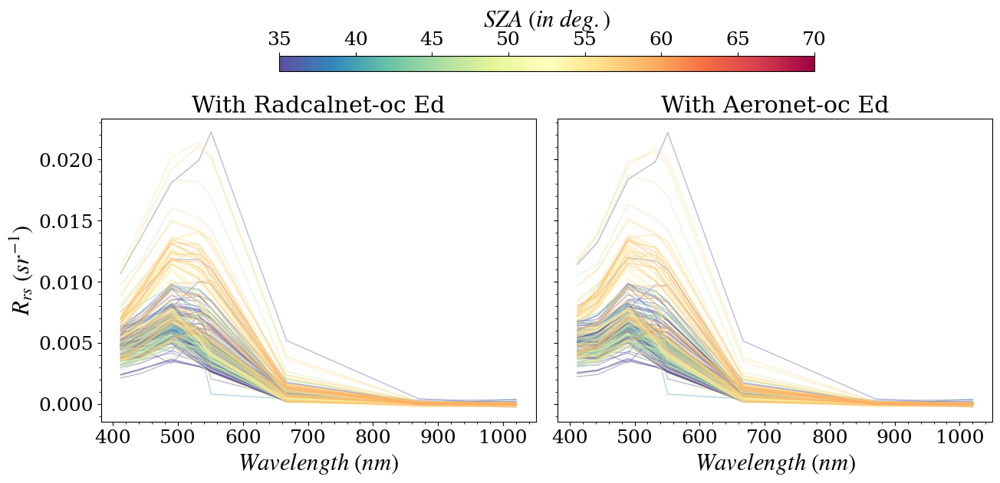

In [173]:
cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=35, vmax=70)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

fig,axs = plt.subplots(1,2,figsize=(15,7),sharey=True,sharex=True)   
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for sza,group in aeronet_oc_.where(aeronet_oc_.sza<60,drop=True).groupby('sza'):
    
    (10*group['Lw']/group['Ed']).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[0])
    (group['Rrs_Lwn']).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[1])
axs[0].set_title('With Radcalnet-oc Ed')
axs[1].set_title('With Aeronet-oc Ed')

for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel('')
    ax.minorticks_on() 
axs[0].set_ylabel(r'$R_{rs}\ (sr^{-1})$')
cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)
plt.show()

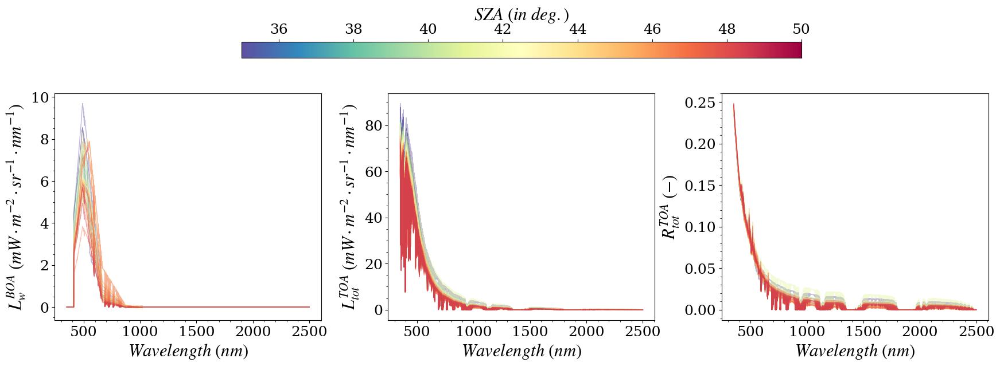

In [45]:
cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=35, vmax=50)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

fig,axs = plt.subplots(1,3,figsize=(21,7),sharex=True)   
fig.subplots_adjust(hspace=0.05, wspace=0.25)
for sza,group in Ed.groupby('sza'):
    
    (group['Lw_toa']).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[0])
    
    E0=group['F0']*group['mu0']*group['D2']
    Ltoa=(group['Lw_toa']+group['Ratm']*E0/np.pi)
    Rtoa=np.pi*Ltoa/E0
    
    Ltoa.plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[1])
    Rtoa.plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[2])
    

axs[0].set_ylabel(r'$L_w^{BOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
axs[1].set_ylabel(r'$L_{tot}^{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
axs[2].set_ylabel(r'$R_{tot}^{TOA}\ (-)$')

for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_title('')
    ax.minorticks_on() 

cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)
plt.show()

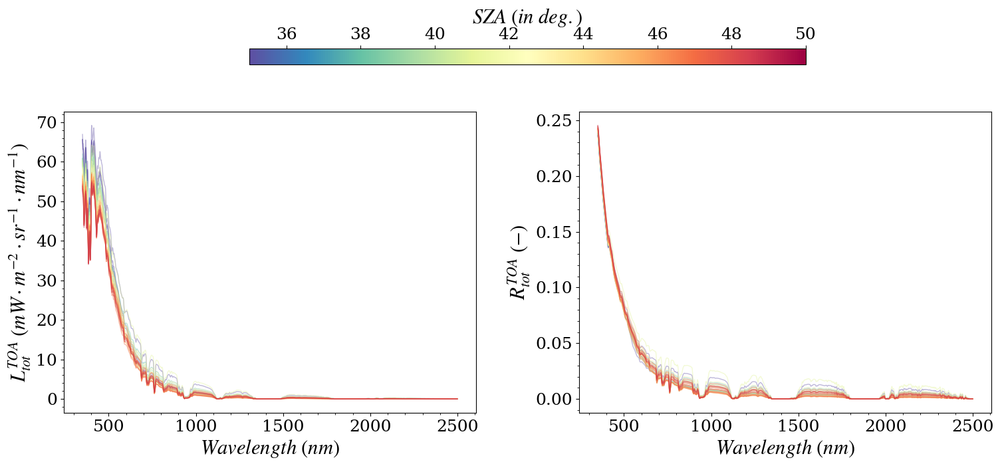

In [47]:
fwhm=3
central_wl = np.arange(350, 2500, 1)
spectral=radoc.Spectral(central_wl,fwhm)



cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=35, vmax=50)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

fig,axs = plt.subplots(1,2,figsize=(18,8),sharex=True)   
fig.subplots_adjust(hspace=0.05, wspace=0.25)
for sza,group in Ed.groupby('sza'):
    
  
    
    E0=group['F0']*group['mu0']*group['D2']
    Ltoa=(group['Lw_toa']+group['Ratm']*E0/np.pi)
    Rtoa=np.pi*Ltoa/E0
    
    spectral.convolve(Ltoa).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[0])
    spectral.convolve(Rtoa).plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',alpha=0.4,ax=axs[1])
    


axs[0].set_ylabel(r'$L_{tot}^{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
axs[1].set_ylabel(r'$R_{tot}^{TOA}\ (-)$')

for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_title('')
    ax.minorticks_on() 

cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$SZA\ (in\ deg.)$', fontsize=22)
plt.show()

2022-03-01T12:56:35.000000000
2022-03-01T13:35:59.000000000
2022-03-01T13:56:31.000000000
2022-03-01T14:35:57.000000000
2022-03-01T15:02:57.000000000
2022-03-01T15:24:40.000000000


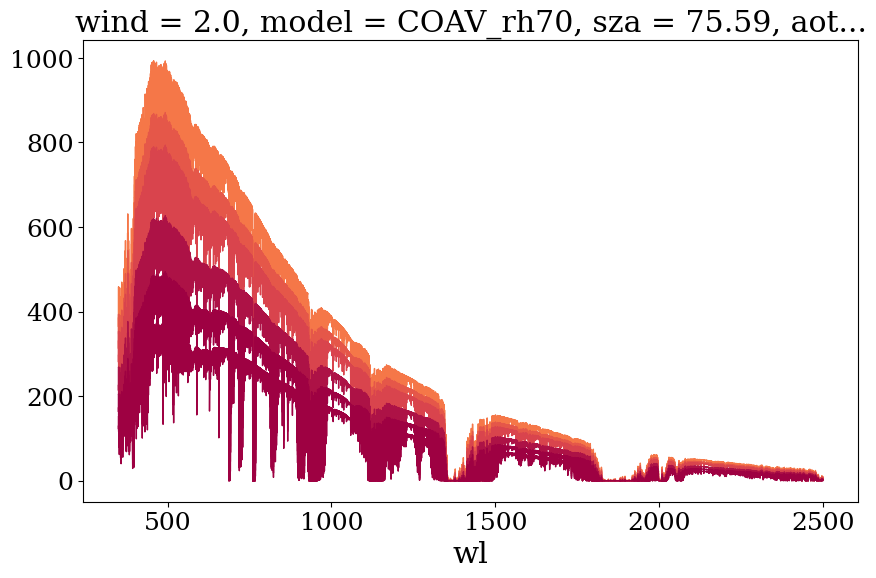

In [36]:
gas_trans = radoc.GaseousTransmittance(lut.gas_lut)
vza=0
cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=10, vmax=70)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
fig,ax = plt.subplots(1,1,figsize=(10,6))   
fig.subplots_adjust(hspace=0.05, wspace=0.25)



for time, aeronet_oc_ in aeronet_oc.sel(time='2022-03-01').groupby('time'):
    pressure, tco3,tcno2, tcwv,aot550,sza = aeronet_oc_[['Pressure(hPa)','tco3','tcno2','tcwv','aot550','SZA']].to_dataframe().values[0]
    print(time)
    
    mu0 = np.cos(np.radians(sza))
    muv = np.cos(np.radians(vza))
    
    gas_trans.pressure=pressure
    gas_trans.gas_tc['h2o'] = tcwv
    gas_trans.gas_tc['o3'] = tco3
    gas_trans.gas_tc['ch4'] = tcch4
    gas_trans.gas_tc['no2'] = tcno2
    
    gas_trans.coef_abs_scat['h2o'] = 1
    gas_trans.coef_abs_scat['ch4'] = 1
    
    gas_trans.air_mass=1./mu0
    Tg_d=gas_trans.get_gaseous_transmittance()
    # signal convolution on spectral responses
    #Tg_d = spectral.convolve(Ttot)
    
   
    
    # irradiance and radiance transmittances of Rayleigh-aerosol
    lut_Ttot_Ed=lut.trans_lut.Ttot_Ed.isel(wind=1,model=1)
    Tra_d = lut_Ttot_Ed.interp(sza=sza).interp(aot_ref=aot550,method='quadratic').interp(wl=central_wl,method='quadratic')
    lut.lut_preparation(sza=[sza])
    
    
    E0 = F0*mu0

    
    Ed=Tra_d*Tg_d*E0
    Ed.plot(x='wl',color=cmap(norm(sza)),lw=1,ls='-',ax=ax)

In [95]:
aeronet_oc.wavelength

<xarray.DataArray 'wavelength' (time: 6458, wl: 8)> Size: 413kB
array([[0.4132, 0.4407, 0.4899, ..., 0.6682, 0.87  , 1.0203],
       [0.4132, 0.4407, 0.4899, ..., 0.6682, 0.87  , 1.0203],
       [0.4132, 0.4407, 0.4899, ..., 0.6682, 0.87  , 1.0203],
       ...,
       [0.4125, 0.442 , 0.4905, ..., 0.6677, 0.8694, 1.0201],
       [0.4125, 0.442 , 0.4905, ..., 0.6677, 0.8694, 1.0201],
       [0.4125, 0.442 , 0.4905, ..., 0.6677, 0.8694, 1.0201]])
Coordinates:
  * time     (time) datetime64[ns] 52kB 2015-01-01T09:46:41 ... 2023-03-12T14...
  * wl       (wl) float64 64B 412.0 443.0 490.0 532.0 551.0 667.0 870.0 1.02e+03

In [14]:
#ds_ = aeronet_oc_daily
#pressure, to3_du,tno2_du, tpw_cm = ds_[['Pressure(hPa)','Total_Ozone(Du)','Total_NO2(DU)','Total_Precipitable_Water(cm)']].to_dataframe().values[0]


fwhm=15
central_wl=lut.Rdiff_lut.wl
spectral=radoc.Spectral(central_wl,fwhm)

#--------------------
# geometry
#--------------------

sza=aeronet_oc_daily['SZA']
vza=0
azi=90

mu0 = np.cos(np.radians(sza))
muv = np.cos(np.radians(vza))

# -------------------
# aerosol
# ---------------------
aot550 = aeronet_oc_daily['Aerosol_Optical_Depth'].interp(wl=550).values
lut.lut_preparation(sza=[sza])

# ----------------------
# gaseous absorption
# ----------------------

# tcwv cm into kg.m-2
tpw_cm=aeronet_oc_daily['Total_Precipitable_Water(cm)']
tcwv=tpw_cm*10 

to3_du=aeronet_oc_daily['Total_Ozone(Du)'] 
pressure=aeronet_oc_daily['Pressure(hPa)']

# conversion O3 du to kg.m-2
tco3=to3_du *2.14485e-5
#NO2 (micromol.m-2)
tcno2_micmol_m2=100
#NO2 (micromol.m-2)
tcno2_du = aeronet_oc_daily['Total_NO2(DU)']
# conversion NO2 micromol.m-2 into kg.m-2
#tcno2=tcno2_micmol_m2*5.1820206e-7
tcno2=tcno2_du*2.055482e-6
tcch4= 1e-2


params = r'$sza= %.1f$' % (sza) + \
        '\n$vza= %.1f$' % (vza) + \
        '\n$aot550 = %.3f$' % (aot550) + \
        '\n$pressure = %.1f$' % (pressure) + \
        '\n$tcwv = %.1f$' % (tcwv) + \
        '\n$tco3 = %.1f$' % (to3_du) 



# ------------------------------
# Computation
# ------------------------------

# set gaseous transmittance values
gas_trans = radoc.GaseousTransmittance(lut.gas_lut)
gas_trans.pressure=pressure
gas_trans.gas_tc['h2o'] = tcwv
gas_trans.gas_tc['o3'] = tco3
gas_trans.gas_tc['ch4'] = tcch4
gas_trans.gas_tc['no2'] = tcno2

gas_trans.coef_abs_scat['h2o'] = 1
gas_trans.coef_abs_scat['ch4'] = 1

gas_trans.air_mass=1./mu0
Ttot=gas_trans.get_gaseous_transmittance()
# signal convolution on spectral responses
Tg_d = spectral.convolve(Ttot)

gas_trans.air_mass=1./muv
Ttot=gas_trans.get_gaseous_transmittance()
Tg_u = spectral.convolve(Ttot)

# irradiance and radiance transmittances of Rayleigh-aerosol
lut_Ttot_Ed=lut.trans_lut.Ttot_Ed.isel(wind=1,model=1)
Tra_d = lut_Ttot_Ed.interp(sza=sza).interp(aot_ref=aot550,method='quadratic').interp(wl=central_wl,method='quadratic')
tra_u = (lut_Ttot_Ed.interp(sza=vza)**1.07).interp(aot_ref=aot550,method='quadratic').interp(wl=central_wl,method='quadratic')

# get solar irradiance
solar_irr=radoc.SolarIrradiance()
signal = solar_irr.tsis
E0 = spectral.convolve(signal)*mu0

# get top-of-atmosphere reflectance or radiance
Rtoa=Tg_u*Tg_d*lut.Rdiff_lut.squeeze().interp(aot_ref=aot550)
Ltoa=Rtoa*E0/np.pi


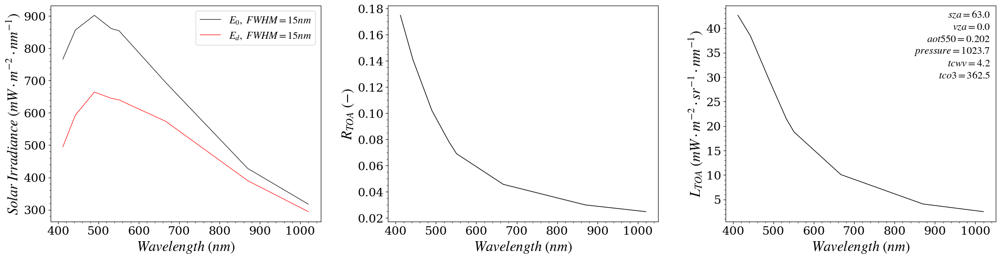

In [27]:
wl_range=slice(400,1050)

fontsize=16

fig,axs = plt.subplots(1,3,figsize=(26,6))   
fig.subplots_adjust(hspace=0.05, wspace=0.25)
ax=axs[0]
E0.sel(wl=wl_range).plot(lw=0.8,c='k',label=r'$E_{0},\ FWHM='+str(fwhm)+r'nm$',ax=ax)
Ed=Tra_d*Tg_d*E0

Ed.sel(wl=wl_range).plot(lw=0.8,c='r',label=r'$E_{d},\ FWHM='+str(fwhm)+r'nm$',ax=ax)
ax.set_ylabel(r'$Solar\ Irradiance\ (mW\cdot m^{-2}\cdot nm^{-1})$')
ax.legend(fontsize=fontsize)

ax=axs[1]
Rtoa.sel(wl=wl_range).plot(x='wl',color='k',lw=1,ax=ax)
     
ax.set_title(r'$SZA='+str(sza)+r'\degree$')
ax.set_ylabel(r'$R_{TOA}\ (-)$')

ax=axs[2]
Ltoa.sel(wl=wl_range).plot(x='wl',color='k',lw=1,ax=ax)
ax.set_ylabel(r'$L_{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')

ax.text(0.98, 0.98, params, fontsize=fontsize, verticalalignment='top', horizontalalignment='right',
                transform=ax.transAxes)
for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    
    ax.minorticks_on() 
    ax.set_title('')


In [47]:
ds_

<xarray.Dataset> Size: 2kB
Dimensions:                       (wl: 8)
Coordinates:
  * wl                            (wl) float64 64B 412.0 443.0 ... 1.02e+03
Data variables: (12/40)
    Aerosol_Optical_Depth         (wl) float64 64B 0.2897 0.27 ... 0.06432
    wavelength                    (wl) float64 64B 0.4113 0.442 ... 0.8694 1.017
    Li_mean                       (wl) float64 64B 6.488 6.131 ... 0.8147 0.4081
    Li_stddev                     (wl) float64 64B 0.001389 ... 0.001286
    Lt_mean                       (wl) float64 64B 0.5646 0.7546 ... 0.01541
    Lt_min_rel                    (wl) float64 64B 0.5516 0.7464 ... 0.014
    ...                            ...
    SZA                           float64 8B 63.04
    year                          float64 8B 2.022e+03
    Rrs_Lw                        (wl) float64 64B 0.002293 ... 4.039e-05
    Rrs_Lwn                       (wl) float64 64B 0.008088 ... 9.422e-05
    Rrs_Lwn_IOP                   (wl) float64 64B 0.007013 ... 9.422e-05
    Rrs_Lwn_fQ                    (wl) float64 64B 0.007458 ... 9.422e-05

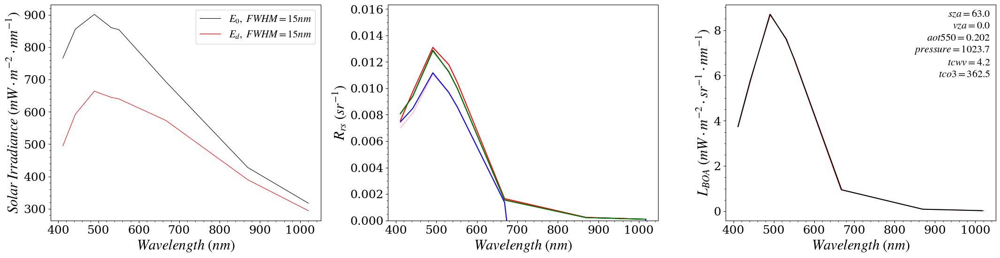

In [28]:
# ______
# ---------------------------------
# Set forward model parameters
# ---------------------------------
param = 'Rrs_Lwn'

ds_ = aeronet_oc_daily
ds_ = ds_.dropna('wl').squeeze()

# ds_ = ds.isel(date=333)
wl = ds_.wavelength.values * 1000

Rrs_meas = ds_[param].values 
# remove deep blue
# wl=wl[1:]
# Rrs_meas=Rrs_meas[1:]


mu0 = np.cos(np.radians(ds_.SZA))
OT=0.52*ds_.Rayleigh_Optical_Depth+0.17*ds_.Aerosol_Optical_Depth+ds_.Ozone_Optical_Depth+ds_.Water_Vapor_Optical_Depth
D2 = radoc.Misc.earth_sun_correction(ds_['Day_of_Year(Fraction)'])
td = np.exp(-OT/mu0)
Rrs_meas2 = ds_.Rrs_Lw/(D2*mu0*td)


fig,axs = plt.subplots(1,3,figsize=(26,6))   
fig.subplots_adjust(hspace=0.05, wspace=0.25)
ax=axs[0]

E0.sel(wl=wl_range).plot(lw=0.8,c='k',label=r'$E_{0},\ FWHM='+str(fwhm)+r'nm$',ax=ax)
Ed=Tra_d*Tg_d*E0

Ed.sel(wl=wl_range).plot(lw=0.8,c='r',label=r'$E_{d},\ FWHM='+str(fwhm)+r'nm$',ax=ax)
ax.set_ylabel(r'$Solar\ Irradiance\ (mW\cdot m^{-2}\cdot nm^{-1})$')
ax.legend(fontsize=fontsize)

ax=axs[1]
Rrs_Lw = (10*ds_.Lw)/Ed
ax.plot(wl,Rrs_Lw,c='r')
ax.plot(wl,Rrs_meas,c='k')
ax.plot(wl,Rrs_meas2,c='g')
ax.plot(wl,ds_.Rrs_Lwn_IOP,c='pink')
ax.plot(wl,ds_.Rrs_Lwn_fQ,c='blue')
ax.set_ylim(0)
ax.set_title(r'$SZA='+str(sza)+r'\degree$')
ax.set_ylabel(r'$R_{rs}\ (sr^{-1})$')

ax=axs[2]
Lboa = Rrs_Lw * Ed
Lboa.sel(wl=wl_range).plot(x='wl',color='r',lw=1,ax=ax)
ax.plot(wl,10*ds_['Lw'].values ,c='k')
ax.set_ylabel(r'$L_{BOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')

ax.text(0.98, 0.98, params, fontsize=fontsize, verticalalignment='top', horizontalalignment='right',
                transform=ax.transAxes)
for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    
    ax.minorticks_on() 
    ax.set_title('')


In [14]:
ds_

<xarray.Dataset> Size: 2kB
Dimensions:                       (wl: 8)
Coordinates:
  * wl                            (wl) float64 64B 412.0 443.0 ... 1.02e+03
Data variables: (12/40)
    Aerosol_Optical_Depth         (wl) float64 64B 0.2556 0.2334 ... 0.06379
    wavelength                    (wl) float64 64B 0.4113 0.442 ... 0.8694 1.017
    Li_mean                       (wl) float64 64B 6.725 6.297 ... 0.7504 0.3785
    Li_stddev                     (wl) float64 64B 0.001887 ... 0.0009824
    Lt_mean                       (wl) float64 64B 0.5819 0.7641 ... 0.01252
    Lt_min_rel                    (wl) float64 64B 0.5533 0.7355 ... 0.009354
    ...                            ...
    SZA                           float64 8B 60.56
    year                          float64 8B 2.022e+03
    Rrs_Lw                        (wl) float64 64B 0.00227 ... -1.312e-05
    Rrs_Lwn                       (wl) float64 64B 0.007212 ... -2.969e-05
    Rrs_Lwn_IOP                   (wl) float64 64B 0.006352 ... -0.01499
    Rrs_Lwn_fQ                    (wl) float64 64B 0.006703 ... -0.01499

In [24]:
from invRrs import utils as u
from invRrs import solver,iopw
plt.ion()
aphy_star,bbphy_star = u.data().load_iop_phyto()
azi=90
nr, ni_ref, S_ni = 1.18, -0.003, 0.0082
spm_norm=1
acdom440=[0.002,0.02]
Scdom=0.017
acdom440_=0.002

acdom = acdom440_*np.exp(-Scdom*(central_wl-440))
    
simu2 = solver.Rrs_inversion(aphy_star, 2*bbphy_star,sza,wl_=xr.DataArray(central_wl,coords={'wl':central_wl},dims='wl'))
simu2.set_coef(sza, vza, azi)

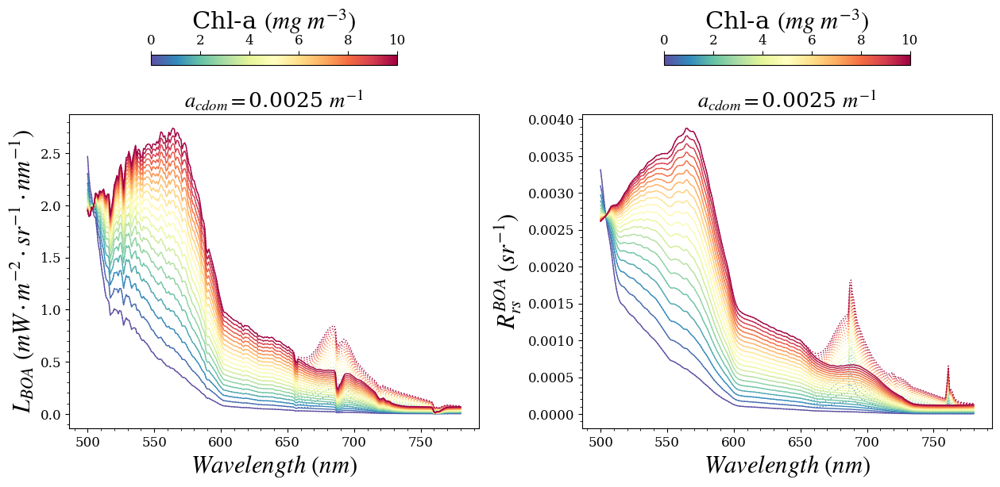

In [37]:
cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=0, vmax=10)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])
fig, axs = plt.subplots(ncols=2, figsize=(15, 7))
fig.subplots_adjust(hspace=0.05, wspace=0.25)

acdom440_=0.0025
Ed = Tra_d*Tg_d*E0
Ed_ex = Ed.interp(wl=450)
for ii,ax in enumerate(axs):
    conv_refl=1
    if ii >0:
        conv_refl=1/Ed    

    for chl in np.linspace(0.01, 10, 20):
        atot = simu2.aphy_star*chl+acdom
        bbtot= simu2.bbphy_star*chl
        
        Rrs = simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza,chl=chl,fluo=False)# #grow_pow(bb_a,B)
    
        Rrs_fluo = simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza,chl=chl,fluo=True)# #grow_pow(bb_a,B)
        
        Rrs_fluo =(Rrs_fluo -Rrs)#/Tg_d
        
        Lw_boa = Ed*Rrs
        Lw_boa_fluo = Lw_boa + Ed_ex*Rrs_fluo#Tra_d*Tg_d*
        (Lw_boa_fluo*conv_refl).sel(wl=wl_range).plot(x='wl',color=cmap(norm(chl)),lw=1,ls=':',ax=ax)

        Lw_toa = tra_u*Tg_u*Lw_boa
        (Lw_boa*conv_refl).sel(wl=wl_range).plot(x='wl',color=cmap(norm(chl)),lw=1,ls='-',ax=ax)
        Ltot = Ltoa + Lw_toa
        #(Ltot*conv_refl).sel(wl=wl_range).plot(x='wl',color=cmap(norm(chl)),lw=1,ax=ax)

for ii,ax in enumerate(axs):
    cb = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=25, pad=0.115, location='top')
    cb.set_label(r'Chl-a $(mg\ m^{-3})$', fontsize=22)
    ax.set_title(r'$a_{cdom}=$'+str(acdom440_)+r' $m^{-1}$')#r'n='+str(nr)+str(ni_ref)+'i')
    
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()
axs[0].set_ylabel(r'$L_{BOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
axs[1].set_ylabel(r'$R_{rs}^{BOA}\ (sr^{-1})$')
#axs[1].set_ylim(0,0.02)
plt.show()

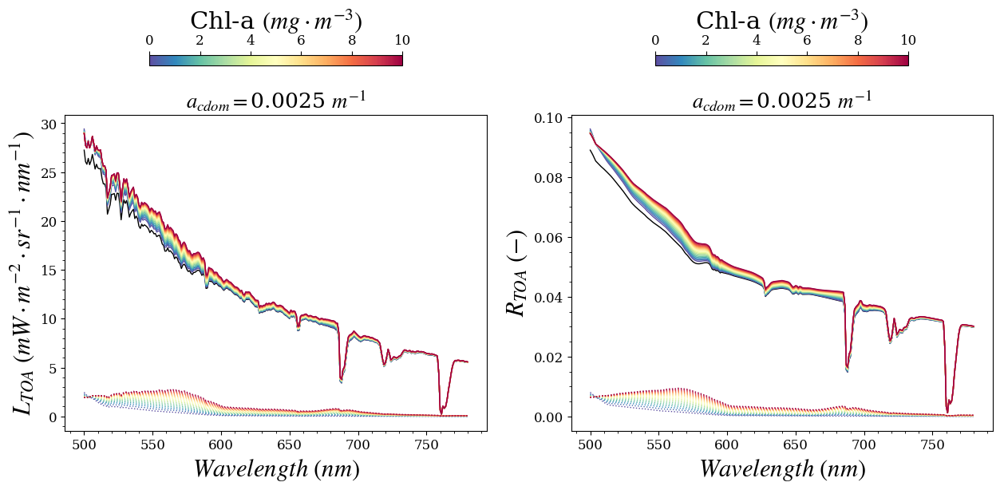

In [32]:
cmap = mpl.colors.LinearSegmentedColormap.from_list("",
                                                    ['navy', "blue", 'lightskyblue',
                                                     "grey",   'forestgreen','yellowgreen',
                                                     "khaki", "gold",
                                                     'orangered', "firebrick", 'purple'])

norm = mpl.colors.Normalize(vmin=0.001,vmax=0.8)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])

cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=0, vmax=10)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])
fig, axs = plt.subplots(ncols=2, figsize=(15, 7))
#fig.subplots_adjust(hspace=0.05, wspace=0.05)



for ii,ax in enumerate(axs):
    conv_refl=1
    if ii >0:
        conv_refl=np.pi/E0
    (Ltoa*conv_refl).sel(wl=wl_range).plot(x='wl',color='k',lw=1,ax=ax)
    
    
    for chl in np.linspace(0.01, 10, 20):
        atot = simu2.aphy_star*chl+acdom
        bbtot= simu2.bbphy_star*chl
        
        Rrs = simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza,chl=chl,fluo=False)# #grow_pow(bb_a,B)
    
        Rrs_fluo = simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza,chl=chl,fluo=True)# #grow_pow(bb_a,B)
        
        Rrs_fluo =(Rrs_fluo -Rrs)/Tg_d
        
        Lw_boa = Ed*(Rrs+Rrs_fluo)
       
        (Lw_boa*conv_refl).sel(wl=wl_range).plot(x='wl',color=cmap(norm(chl)),lw=1,ls=':',ax=ax)
        Lw_toa = tra_u*Tg_u*Lw_boa
        Ltot=Ltoa+   Lw_toa
        (Ltot*conv_refl).sel(wl=wl_range).plot(x='wl',color=cmap(norm(chl)),lw=1,ax=ax)

for ii,ax in enumerate(axs):
    cb = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=25, pad=0.115, location='top')
    cb.set_label(r'Chl-a $(mg\cdot m^{-3})$', fontsize=22)
    ax.set_title(r'$a_{cdom}=$'+str(acdom440_)+r' $m^{-1}$')#r'n='+str(nr)+str(ni_ref)+'i')
    
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()
axs[0].set_ylabel(r'$L_{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
axs[1].set_ylabel(r'$R_{TOA}\ (-)$')
#axs[1].set_ylim(0,0.02)
plt.show()

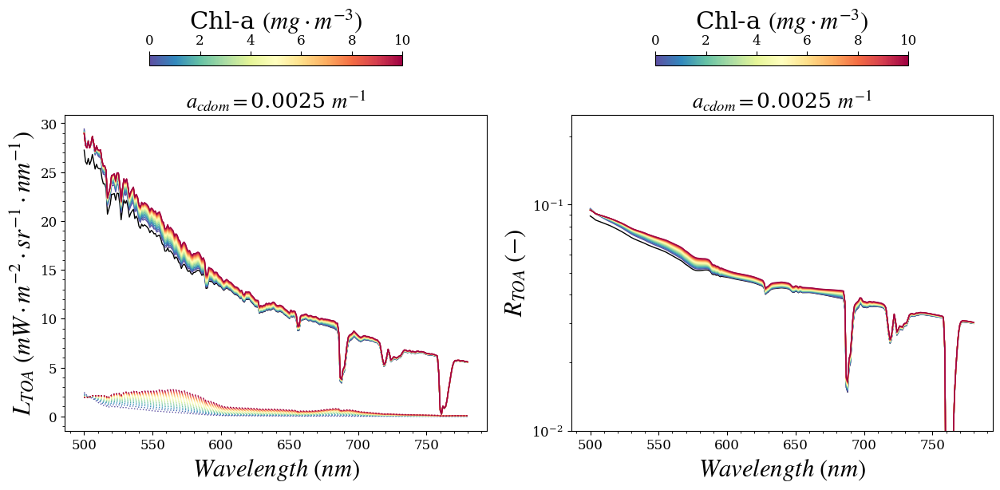

In [27]:

wl_range=slice(500,780)

cmap = plt.cm.Spectral_r
norm = mpl.colors.Normalize(vmin=0, vmax=10)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])
fig, axs = plt.subplots(ncols=2, figsize=(15, 7))
#fig.subplots_adjust(hspace=0.05, wspace=0.05)



for ii,ax in enumerate(axs):
    conv_refl=1
    if ii >0:
        conv_refl=np.pi/E0
    (Ltoa*conv_refl).sel(wl=wl_range).plot(x='wl',color='k',lw=1,ax=ax)
    
    
    for chl in np.linspace(0.01, 10, 20):
        atot = simu2.aphy_star*chl+acdom
        bbtot= simu2.bbphy_star*chl
        
        Rrs = simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza,chl=chl,fluo=False)# #grow_pow(bb_a,B)
    
        Rrs_fluo = simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza,chl=chl,fluo=True)# #grow_pow(bb_a,B)
        
        Rrs_fluo =(Rrs_fluo -Rrs)/Tg_d
        
        Lw_boa = Ed*(Rrs+Rrs_fluo)
       
        (Lw_boa*conv_refl).sel(wl=wl_range).plot(x='wl',color=cmap(norm(chl)),lw=1,ls=':',ax=ax)
        Lw_toa = tra_u*Tg_u*Lw_boa
        Ltot=Ltoa+   Lw_toa
        (Ltot*conv_refl).sel(wl=wl_range).plot(x='wl',color=cmap(norm(chl)),lw=1,ax=ax)

for ii,ax in enumerate(axs):
    cb = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=25, pad=0.115, location='top')
    cb.set_label(r'Chl-a $(mg\cdot m^{-3})$', fontsize=22)
    ax.set_title(r'$a_{cdom}=$'+str(acdom440_)+r' $m^{-1}$')#r'n='+str(nr)+str(ni_ref)+'i')
    
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()
axs[0].set_ylabel(r'$L_{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
axs[1].set_ylabel(r'$R_{TOA}\ (-)$')
#axs[1].set_ylim(0,0.02)
axs[1].semilogy()
axs[1].set_ylim(1e-2,0.25)
plt.show()

In [31]:
aphy_star,bbphy_star = u.data().load_iop_phyto()
azi=90
nr, ni_ref, S_ni = 1.18, -0.003, 0.0082
spm_norm=1
acdom440=[0.002,0.02]
Scdom=0.017
acdom440_=0.002

acdom = acdom440_*np.exp(-Scdom*(central_wl-440))
    
simu2 = solver.Rrs_inversion(aphy_star, 2*bbphy_star,sza,wl_=xr.DataArray(central_wl,coords={'wl':central_wl},dims='wl'))
simu2.set_coef(sza, vza, azi)

wl_range=slice(400,750)

nr, ni_ref, S_ni = 1.18, -0.003, 0.0082
spm_norm=1
acdom440=[0.002,0.02]
Scdom=0.017
acdom = acdom440_*np.exp(-Scdom*(central_wl-440))

simu2 = solver.Rrs_inversion(aphy_star, 2*bbphy_star,sza,wl_=xr.DataArray(wl,coords={'wl':wl},dims='wl'))
simu2.set_coef(sza, vza, azi)


fig, axs = plt.subplots(ncols=2, figsize=(15, 7))
#fig.subplots_adjust(hspace=0.05, wspace=0.05)

acdom440_=0.0025
Ed = Tra_d*Tg_d*E0

for ii,ax in enumerate(axs):
    conv_refl=1
    if ii >0:
        conv_refl=np.pi/Ed
    
    

    for chl in np.linspace(0.01, 10, 20):
        atot = simu2.aphy_star*chl+acdom
        bbtot= simu2.bbphy_star*chl
        #Rrs =  simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza,chl=chl,fluo=True)# #grow_pow(bb_a,B)
        Rrs = simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza,chl=chl,fluo=False)# #grow_pow(bb_a,B)
    
        Rrs_fluo = simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza,chl=chl,fluo=True)# #grow_pow(bb_a,B)
        Rrs_fluo =(Rrs_fluo -Rrs)/Tg_d
        
        Lw_boa = Ed*(Rrs+Rrs_fluo)#Tra_d*Tg_d*
        
        Lw_toa = tra_u*Tg_u*Lw_boa
        (Lw_boa*conv_refl).sel(wl=wl_range).plot(x='wl',color=cmap(norm(chl)),lw=1,ls='-',ax=ax)
        Ltot = Ltoa + Lw_toa
        #(Ltot*conv_refl).sel(wl=wl_range).plot(x='wl',color=cmap(norm(chl)),lw=1,ax=ax)

for ii,ax in enumerate(axs):
    cb = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=25, pad=0.115, location='top')
    cb.set_label(r'Chl-a $(mg\ m^{-3})$', fontsize=22)
    ax.set_title(r'$a_{cdom}=$'+str(acdom440_)+r' $m^{-1}$')#r'n='+str(nr)+str(ni_ref)+'i')
    
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()
axs[0].set_ylabel(r'$L_{BOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
axs[1].set_ylabel(r'$R_{BOA}\ (-)$')
#axs[1].set_ylim(0,0.02)
plt.show()

NameError: name 'wl' is not defined

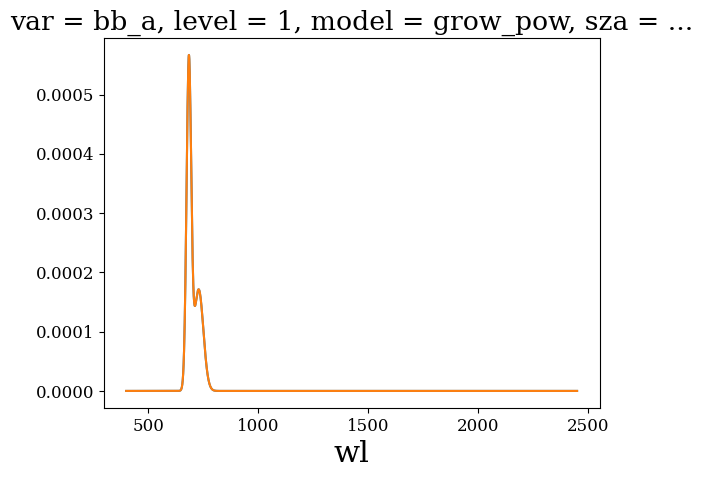

In [45]:
Rrs_fluo.plot()
plt.show()

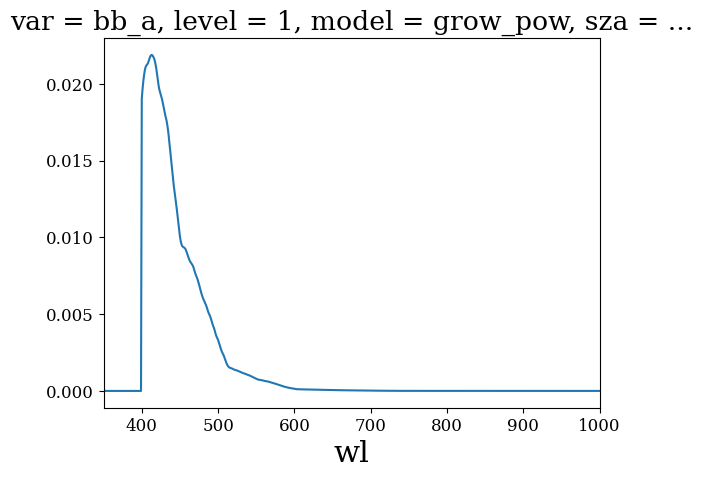

In [15]:

from invRrs import utils as u
from invRrs import solver,iopw
aphy_star,bbphy_star = u.data().load_iop_phyto()
wl=E0.wl.values
# water model
nr, ni_ref, S_ni = 1.18, -0.003, 0.0082
spm_norm=0

Scdom=0.017
chl=0.05

acdom440=0.001
acdom = acdom440*np.exp(-Scdom*(wl-440))

simu2 = solver.Rrs_inversion(aphy_star, bbphy_star,sza,wl_=xr.DataArray(wl,coords={'wl':wl},dims='wl'))
simu2.set_coef(sza, vza, azi)

atot = simu2.aphy_star*chl+acdom
bbtot= simu2.bbphy_star*chl
Rrs = simu2.simple_forward_model(atot, bbtot,vza=vza,azi=90,sza=sza)# #grow_pow(bb_a,B)
plt.figure() 
Rrs[np.isnan(Rrs)]=0
Rrs.plot()
plt.xlim(350,1000)
plt.show()

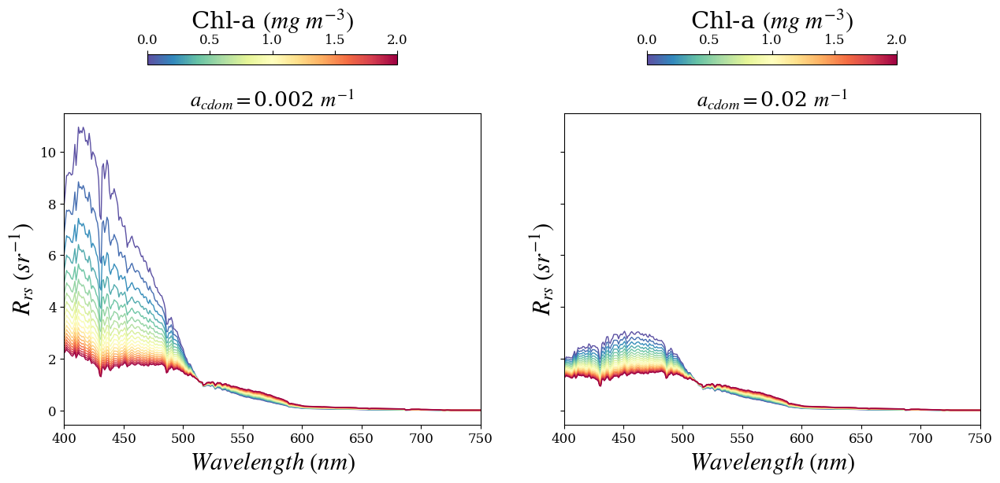

In [21]:
# ---------------------------------,100,120,150
# Variation SPM, turbi
# ---------------------------------
density=2.65
cmap = plt.cm.Spectral_r
norm = mpl.colors.LogNorm(vmin=0.1, vmax=800)
norm = mpl.colors.Normalize(vmin=0, vmax=2)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])
nr, ni_ref, S_ni = 1.18, -0.003, 0.0082
spm_norm=1
acdom440=[0.002,0.02]
Scdom=0.017
fig, axs = plt.subplots(ncols=2, figsize=(15, 7), sharey=True)
#fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ii, acdom440_ in enumerate(acdom440):
    acdom = acdom440_*np.exp(-Scdom*(wl-440))
    
    simu2 = solver.Rrs_inversion(aphy_star, bbphy_star,sza,wl_=xr.DataArray(wl,coords={'wl':wl},dims='wl'))
    simu2.set_coef(sza, vza, azi)
    for chl in np.linspace(0.01, 2, 20):
        atot = simu2.aphy_star*chl+acdom
        bbtot= simu2.bbphy_star*chl
        Rrs = tra_u*Tra_d*Tg_u*Tg_d*E0*simu2.simple_forward_model(atot, bbtot,vza=vza,azi=azi,sza=sza)# #grow_pow(bb_a,B)
        Rrs.plot(ax=axs[ii],color=cmap(norm(chl)),lw=1)


for ii,ax in enumerate(axs):
    cb = fig.colorbar(sm, ax=ax, shrink=0.6, aspect=25, pad=0.115, location='top')
    cb.set_label(r'Chl-a $(mg\ m^{-3})$', fontsize=22)
    ax.set_title(r'$a_{cdom}=$'+str(acdom440[ii])+r' $m^{-1}$')#r'n='+str(nr)+str(ni_ref)+'i')
    
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel(r'$R_{rs}\ (sr^{-1})$')
    ax.set_xlim(400,750)
plt.show()
   

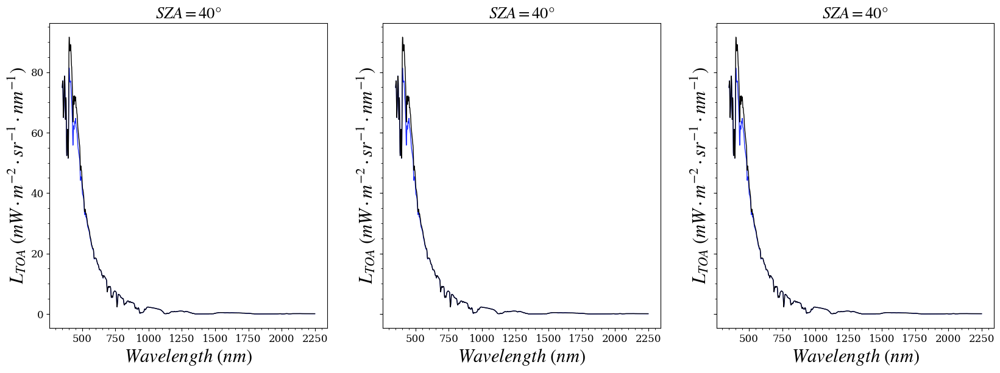

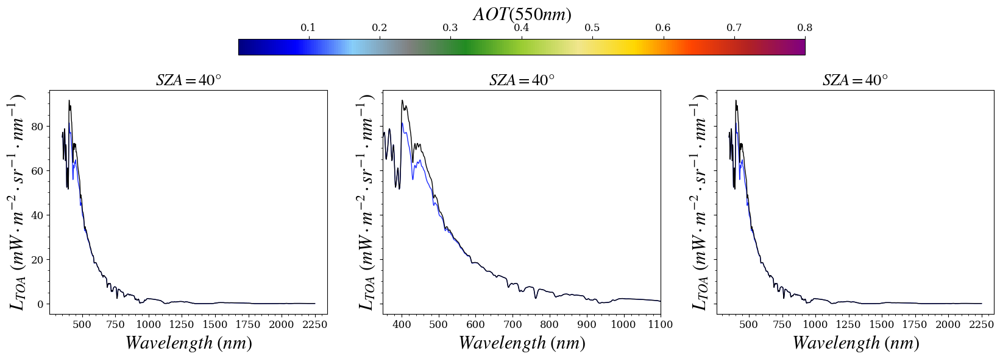

In [45]:
Lw_toa=tra_u*Tra_d*Tg_u*Tg_d*E0*Rrs
wl_range=slice(350,2250)
cmap = mpl.colors.LinearSegmentedColormap.from_list("",
                                                    ['navy', "blue", 'lightskyblue',
                                                     "grey",   'forestgreen','yellowgreen',
                                                     "khaki", "gold",
                                                     'orangered', "firebrick", 'purple'])

norm = mpl.colors.Normalize(vmin=0.001,vmax=0.8)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])
fig,axs = plt.subplots(1,3,figsize=(20,6.5),sharey=True)
axs=axs.ravel()

for isza, sza in enumerate([40,40,40]):
    ax=axs[isza]
   
    Ltoa_=Ltoa.sel(sza=sza).interp(aot_ref=aot550) #+ Tabs*Ttot*  np.pi * Rrs
    #Rsim.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),add_legend=False,ls=':',lw=1,ax=axs[i_])
    Ltoa_.sel(wl=wl_range).plot(x='wl',color=cmap(norm(aot550)),lw=1,ax=ax)
    (Ltoa_+   Lw_toa).sel(wl=wl_range).plot(x='wl',color='k',lw=1,ax=ax)
    ax.set_title(r'$SZA='+str(sza)+r'\degree$')
    ax.set_ylabel(r'$L_{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()
axs[1].set_xlim(350,1100)
cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$AOT(550nm)$', fontsize=22)
plt.show()

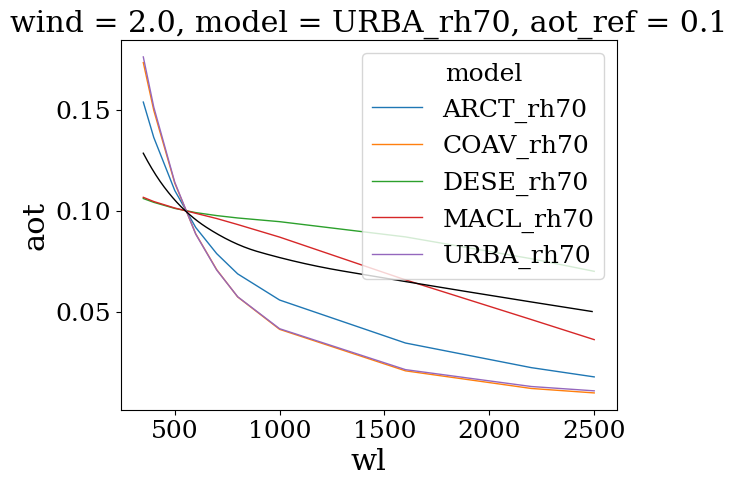

In [5]:
aot550=0.1
(lut.aero_lut.aot.interp(aot_ref=aot550)).plot(x='wl',hue='model',lw=1)#,add_legend=False)
(lut.aot_lut.interp(aot_ref=aot550)).plot(x='wl',c='k',lw=1)#,add_legend=False)

plt.show()

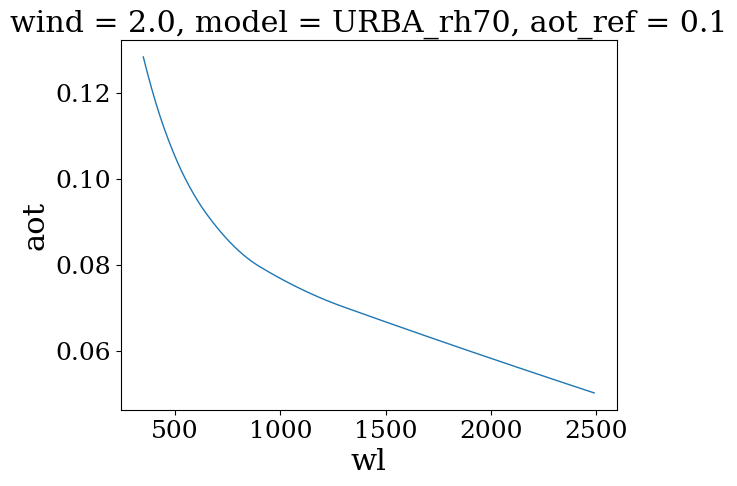

In [6]:
aot550=0.1
(lut.aot_lut.interp(aot_ref=aot550)).plot(x='wl',hue='model',lw=1)#,add_legend=False)
plt.show()

In [7]:
lut.gas_lut

<xarray.Dataset> Size: 2MB
Dimensions:  (wl: 21687)
Coordinates:
  * wl       (wl) float64 173kB 349.9 350.1 350.3 ... 2.599e+03 2.6e+03
Data variables:
    ch4      (wl) float64 173kB ...
    co       (wl) float64 173kB ...
    co2      (wl) float64 173kB ...
    h2o      (wl) float64 173kB ...
    n2o      (wl) float64 173kB ...
    no2      (wl) float64 173kB ...
    o2       (wl) float64 173kB ...
    o3       (wl) float64 173kB ...
    o4       (wl) float64 173kB ...
Attributes:
    description:           Absorption optical thickness of some atmospheric g...
    atmospheric pressure:  1000 hPa

In [26]:




sza=40
vza=0

# tcwv cm into kg.m-2
tpw_cm=2.6
tcwv=tpw_cm*10 

to3_du=300 
pressure=1000



# conversion O3 du to kg.m-2
tco3=to3_du *6.4286e-3/300
tcno2=3e-6/100
tcch4= 1e-2


gas_trans = radoc.GaseousTransmittance(lut.gas_lut)
gas_trans.pressure=pressure
gas_trans.gas_tc['h2o'] = tcwv
gas_trans.gas_tc['o3'] = tco3
gas_trans.gas_tc['ch4'] = tcch4
gas_trans.air_mass=1./np.cos(np.radians(sza))+1./np.cos(np.radians(vza))
# set total transmittance values
gas_trans.coef_abs_scat['h2o'] = 1
gas_trans.coef_abs_scat['ch4'] = 1
Ttot=gas_trans.get_gaseous_transmittance()

In [29]:
gas_trans = radoc.GaseousTransmittance(lut.gas_lut)
gas_trans.pressure=pressure
gas_trans.gas_tc['h2o'] = tcwv
gas_trans.gas_tc['o3'] = tco3
gas_trans.gas_tc['ch4'] = tcch4

# set total transmittance values
gas_trans.coef_abs_scat['h2o'] = 0.5
gas_trans.coef_abs_scat['ch4'] = 0.65

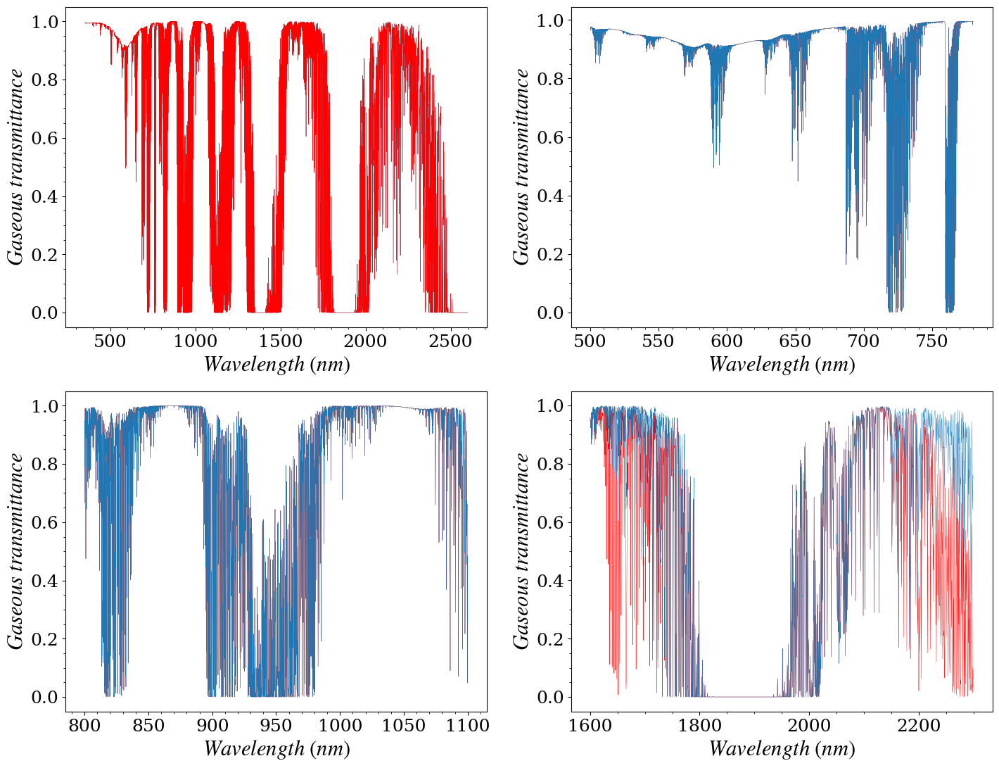

In [32]:
gas_trans.air_mass=1./np.cos(np.radians(sza))+1./np.cos(np.radians(vza))
Ttot=gas_trans.get_gaseous_transmittance()
# set total transmittance values
gas_trans.coef_abs_scat['h2o'] = 1
gas_trans.coef_abs_scat['ch4'] = 1
Ttot2=gas_trans.get_gaseous_transmittance()

fig,axs = plt.subplots(2,2,figsize=(17,13))
axs=axs.ravel()

Ttot.plot(lw=0.3,ax=axs[0])
Ttot.plot(lw=0.3,ax=axs[0],c='r')

wl_range=slice(500,780)
Ttot2.sel(wl=wl_range).plot(lw=0.3,ax=axs[1],c='r')
Ttot.sel(wl=wl_range).plot(lw=0.3,ax=axs[1],label='Tg')
wl_range=slice(800,1100)
Ttot2.sel(wl=wl_range).plot(lw=0.3,ax=axs[2],c='r')
Ttot.sel(wl=wl_range).plot(lw=0.3,ax=axs[2],label='Tg')
wl_range=slice(1600,2300)
Ttot2.sel(wl=wl_range).plot(lw=0.3,ax=axs[3],c='r')
Ttot.sel(wl=wl_range).plot(lw=0.3,ax=axs[3],label='Tg')

for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel(r'$Gaseous\ transmittance$')
    ax.minorticks_on()
    #ax.semilogy()

#plt.semilogy()

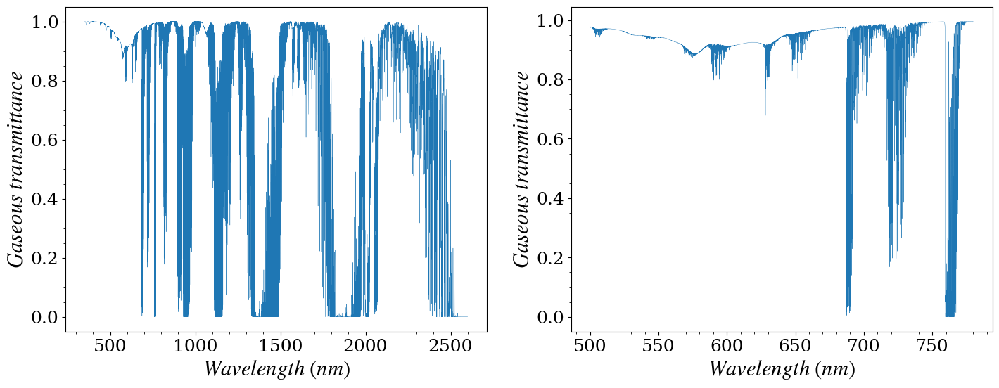

In [9]:
fig,axs = plt.subplots(1,2,figsize=(17,6))

Ttot.plot(lw=0.3,ax=axs[0],label='Kurucz')

wl_range=slice(500,780)

Ttot.sel(wl=wl_range).plot(lw=0.3,ax=axs[1],label='Tg')


for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel(r'$Gaseous\ transmittance$')
    ax.minorticks_on()
    #ax.semilogy()

#plt.semilogy()

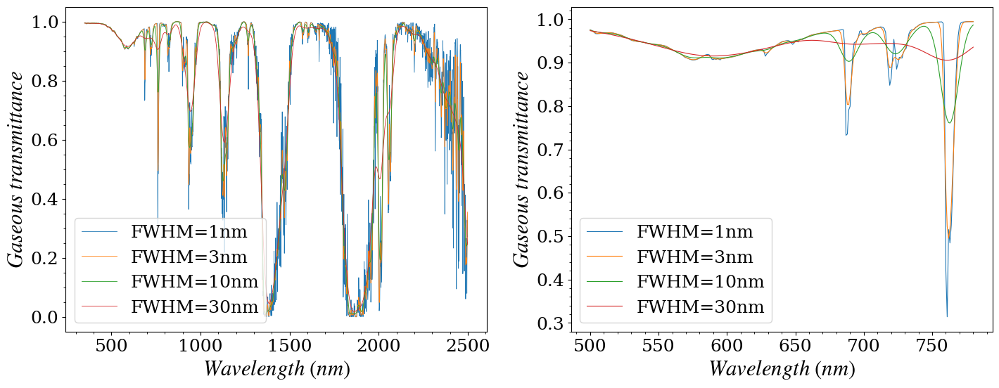

In [23]:

fwhm=30.

spectral_res=1
central_wl=np.arange(350,2500,spectral_res)
wl_range=slice(500,780)

signal = Ttot
wl_signal = Ttot.wl.values
fig,axs = plt.subplots(1,2,figsize=(17,6))
for fwhm in [1,3,10,30]:    
    spectral=radoc.Spectral(central_wl,fwhm)
    F0 = spectral.convolve(signal)
    F0.plot(lw=0.6,label='FWHM='+str(fwhm)+'nm',ax=axs[0])
    F0.sel(wl=wl_range).plot(lw=0.8,label='FWHM='+str(fwhm)+'nm',ax=axs[1])

for ax in axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel(r'$Gaseous\ transmittance$')
    ax.minorticks_on()  
    ax.legend()

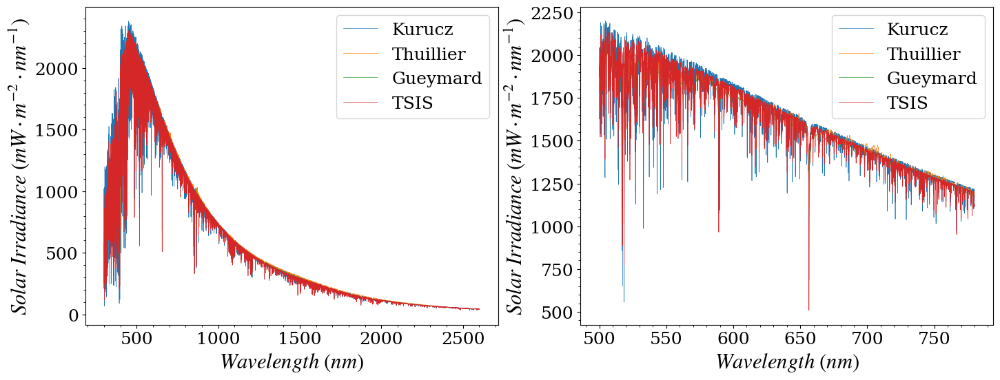

In [11]:
solar_irr=radoc.SolarIrradiance()
fig,axs = plt.subplots(1,2,figsize=(17,6))

solar_irr.kurucz.plot(lw=0.5,ax=axs[0],label='Kurucz')
solar_irr.thuillier.plot(lw=0.5,ax=axs[0],label='Thuillier')
solar_irr.gueymard.plot(lw=0.5,ax=axs[0],label='Gueymard')
solar_irr.tsis.plot(lw=0.5,ax=axs[0],label='TSIS')

axs[0].legend()

wl_range=slice(500,780)
solar_irr.kurucz.sel(wl=wl_range).plot(lw=0.5,ax=axs[1],label='Kurucz')
solar_irr.thuillier.sel(wl=wl_range).plot(lw=0.5,ax=axs[1],label='Thuillier')
solar_irr.gueymard.sel(wl=wl_range).plot(lw=0.5,ax=axs[1],label='Gueymard')
solar_irr.tsis.sel(wl=wl_range).plot(lw=0.5,ax=axs[1],label='TSIS')
axs[1].legend()

for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel(r'$Solar\ Irradiance\ (mW\cdot m^{-2}\cdot nm^{-1})$')
    ax.minorticks_on()
    #ax.semilogy()

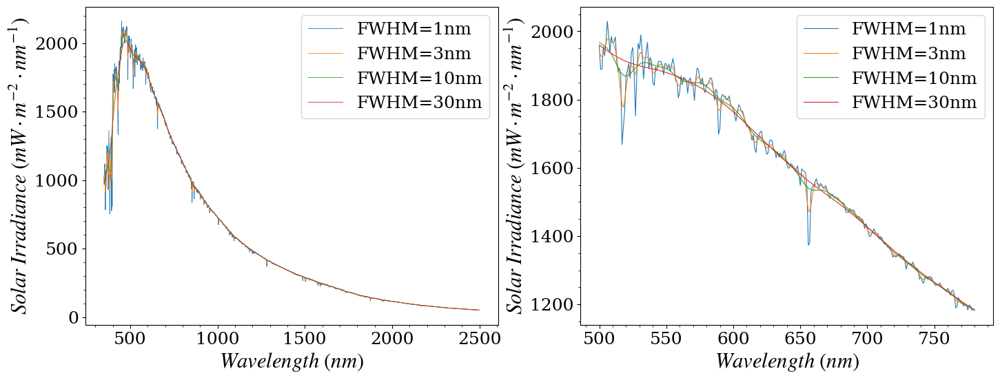

In [12]:

fwhm=30.

spectral_res=1
central_wl=np.arange(350,2500,spectral_res)
wl_range=slice(500,780)

signal = solar_irr.tsis
wl_signal = solar_irr.tsis.wl.values
fig,axs = plt.subplots(1,2,figsize=(17,6))
for fwhm in [1,3,10,30]:    
    spectral=radoc.Spectral(central_wl,fwhm)
    F0 = spectral.convolve(signal)
    F0.plot(lw=0.6,label='FWHM='+str(fwhm)+'nm',ax=axs[0])
    F0.sel(wl=wl_range).plot(lw=0.8,label='FWHM='+str(fwhm)+'nm',ax=axs[1])

for ax in  axs:
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_ylabel(r'$Solar\ Irradiance\ (mW\cdot m^{-2}\cdot nm^{-1})$')
    ax.minorticks_on()  
    ax.legend()

/home/harmel/Dropbox/Dropbox/work/git/vrtc/radcalnet_oc/radcalnet_oc/data/lut/gases/lut_abs_opt_thickness_normalized.nc
/home/harmel/Dropbox/Dropbox/work/git/vrtc/radcalnet_oc/radcalnet_oc/data/lut/gases/lut_abs_opt_thickness_normalized.nc


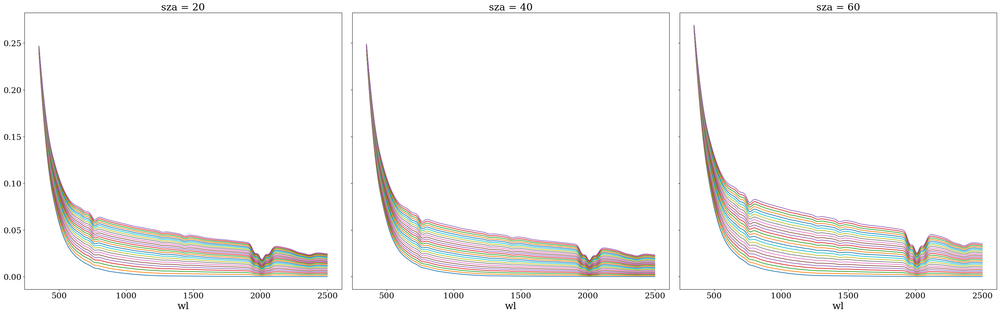

In [17]:
lut= radoc.LUT(wl=np.arange(350, 2500, 1))
lut.lut_preparation(wind=2,
                    sza=[20, 40, 60],
                    vza=[0],
                    azi=[0],
                    aot_refs=np.linspace(0.0, 0.8, 25),
                    weights=[0, 0.5, 1, 0., 0.])
lut2= radoc.LUT(wl=np.arange(350, 2500, 1))
lut2.lut_preparation(wind=6,
                    sza=[20, 40, 60],
                    vza=[0],
                    azi=[0],
                    aot_refs=np.linspace(0.0, 0.8, 25),
                    weights=[0, 0.5, 1, 0., 0.])


central_wl=lut.Rdiff_lut.wl
signal = Ttot
wl_signal = Ttot.wl.values
spectral=radoc.Spectral(central_wl,fwhm)
Tg = spectral.convolve(signal)

(Tg*lut.Rdiff_lut).squeeze().plot(col='sza',hue='aot_ref',size=10,add_legend=False)

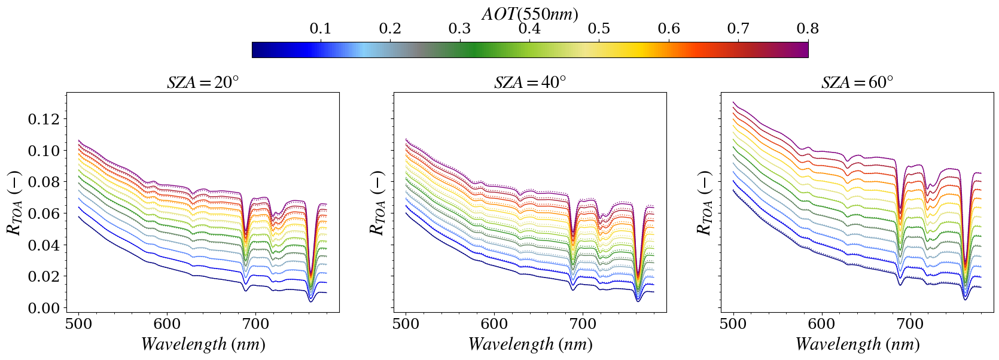

In [37]:
fwhm=3
central_wl=lut.Rdiff_lut.wl
signal = Ttot
wl_signal = Ttot.wl.values
spectral=radoc.Spectral(central_wl,fwhm)
Tg = spectral.convolve(signal)

signal = solar_irr.tsis
F0 = spectral.convolve(signal)

Rtoa=Tg*lut.Rdiff_lut.squeeze()
Rtoa2=Tg*lut2.Rdiff_lut.squeeze()
wl_range=slice(500,780)
cmap = mpl.colors.LinearSegmentedColormap.from_list("",
                                                    ['navy', "blue", 'lightskyblue',
                                                     "grey",   'forestgreen','yellowgreen',
                                                     "khaki", "gold",
                                                     'orangered', "firebrick", 'purple'])
norm = mpl.colors.Normalize(vmin=0.001,vmax=0.8)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

fig,axs = plt.subplots(1,3,figsize=(20,6.5),sharey=True)
axs=axs.ravel()

for isza, sza in enumerate(Rtoa.sza.values):
    ax=axs[isza]
    for aot_ref in Rtoa.aot_ref.values[::2]:
        Rtoa_=Rtoa.sel(sza=sza,aot_ref=aot_ref).sel(wl=wl_range) #+ Tabs*Ttot*  np.pi * Rrs
        #Rsim.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),add_legend=False,ls=':',lw=1,ax=axs[i_])
        Rtoa_.plot(x='wl',color=cmap(norm(aot_ref)),lw=1,ax=ax)
        Rtoa_=Rtoa2.sel(sza=sza,aot_ref=aot_ref).sel(wl=wl_range) #+ Tabs*Ttot*  np.pi * Rrs
       
        Rtoa_.plot(x='wl',color=cmap(norm(aot_ref)),ls=':',lw=1,ax=ax)
    ax.set_title(r'$SZA='+str(sza)+r'\degree$')
    ax.set_ylabel(r'$R_{TOA}\ (-)$')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()

cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$AOT(550nm)$', fontsize=22)

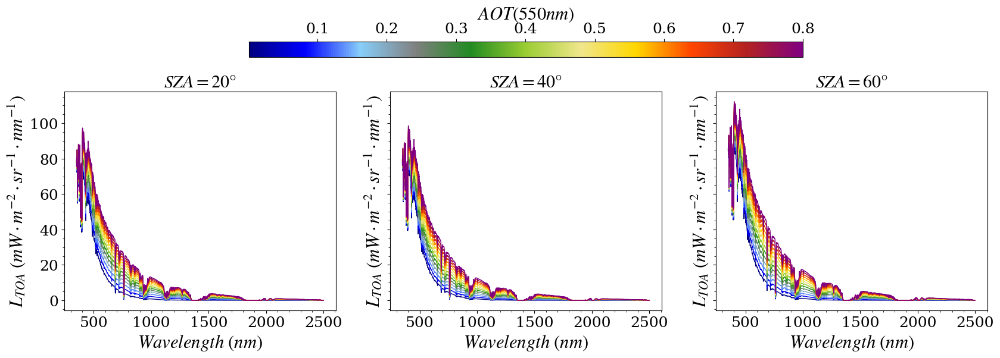

In [28]:
fwhm=1
central_wl=lut.Rdiff_lut.wl
signal = Ttot
wl_signal = Ttot.wl.values
spectral=radoc.Spectral(central_wl,fwhm)
Tg = spectral.convolve(signal)

signal = solar_irr.tsis
F0 = spectral.convolve(signal)

Rtoa=Tg*lut.Rdiff_lut.squeeze()*F0/np.pi


cmap = mpl.colors.LinearSegmentedColormap.from_list("",
                                                    ['navy', "blue", 'lightskyblue',
                                                     "grey",   'forestgreen','yellowgreen',
                                                     "khaki", "gold",
                                                     'orangered', "firebrick", 'purple'])

norm = mpl.colors.Normalize(vmin=0.001,vmax=0.8)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])
fig,axs = plt.subplots(1,3,figsize=(20,6.5),sharey=True)
axs=axs.ravel()

for isza, sza in enumerate(Rtoa.sza.values):
    ax=axs[isza]
    for aot_ref in Rtoa.aot_ref.values[::2]:
        Rtoa_=Rtoa.sel(sza=sza,aot_ref=aot_ref) #+ Tabs*Ttot*  np.pi * Rrs
        #Rsim.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),add_legend=False,ls=':',lw=1,ax=axs[i_])
        Rtoa_.plot(x='wl',color=cmap(norm(aot_ref)),lw=1,ax=ax)
    ax.set_title(r'$SZA='+str(sza)+r'\degree$')
    ax.set_ylabel(r'$L_{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()

cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$AOT(550nm)$', fontsize=22)

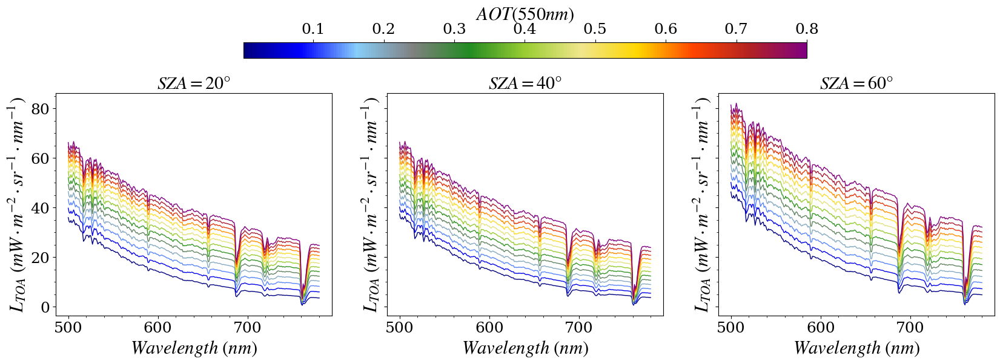

In [29]:
fwhm=1
central_wl=lut.Rdiff_lut.wl
signal = Ttot
wl_signal = Ttot.wl.values
spectral=radoc.Spectral(central_wl,fwhm)
Tg = spectral.convolve(signal)

signal = solar_irr.tsis
F0 = spectral.convolve(signal)

Rtoa=Tg*lut.Rdiff_lut.squeeze()*F0/np.pi


cmap = mpl.colors.LinearSegmentedColormap.from_list("",
                                                    ['navy', "blue", 'lightskyblue',
                                                     "grey",   'forestgreen','yellowgreen',
                                                     "khaki", "gold",
                                                     'orangered', "firebrick", 'purple'])

norm = mpl.colors.Normalize(vmin=0.001,vmax=0.8)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])
fig,axs = plt.subplots(1,3,figsize=(20,6.5),sharey=True)
axs=axs.ravel()

for isza, sza in enumerate(Rtoa.sza.values):
    ax=axs[isza]
    for aot_ref in Rtoa.aot_ref.values[::2]:
        Rtoa_=Rtoa.sel(wl=slice(500,780)).sel(sza=sza,aot_ref=aot_ref) #+ Tabs*Ttot*  np.pi * Rrs
        #Rsim.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),add_legend=False,ls=':',lw=1,ax=axs[i_])
        Rtoa_.plot(x='wl',color=cmap(norm(aot_ref)),lw=1,ax=ax)
    ax.set_title(r'$SZA='+str(sza)+r'\degree$')
    ax.set_ylabel(r'$L_{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()

cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$AOT(550nm)$', fontsize=22)

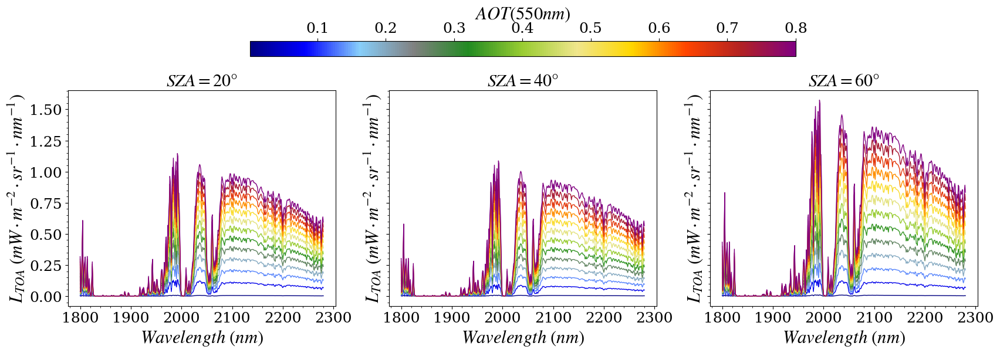

In [33]:
fwhm=1
central_wl=lut.Rdiff_lut.wl
signal = Ttot
wl_signal = Ttot.wl.values
spectral=radoc.Spectral(central_wl,fwhm)
Tg = spectral.convolve(signal)

signal = solar_irr.tsis
F0 = spectral.convolve(signal)

Rtoa=Tg*lut.Rdiff_lut.squeeze()*F0/np.pi


cmap = mpl.colors.LinearSegmentedColormap.from_list("",
                                                    ['navy', "blue", 'lightskyblue',
                                                     "grey",   'forestgreen','yellowgreen',
                                                     "khaki", "gold",
                                                     'orangered', "firebrick", 'purple'])

norm = mpl.colors.Normalize(vmin=0.001,vmax=0.8)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])
fig,axs = plt.subplots(1,3,figsize=(20,6.5),sharey=True)
axs=axs.ravel()

for isza, sza in enumerate(Rtoa.sza.values):
    ax=axs[isza]
    for aot_ref in Rtoa.aot_ref.values[::2]:
        Rtoa_=Rtoa.sel(wl=slice(1800,2280)).sel(sza=sza,aot_ref=aot_ref) #+ Tabs*Ttot*  np.pi * Rrs
        #Rsim.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),add_legend=False,ls=':',lw=1,ax=axs[i_])
        Rtoa_.plot(x='wl',color=cmap(norm(aot_ref)),lw=1,ax=ax)
    ax.set_title(r'$SZA='+str(sza)+r'\degree$')
    ax.set_ylabel(r'$L_{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()

cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$AOT(550nm)$', fontsize=22)

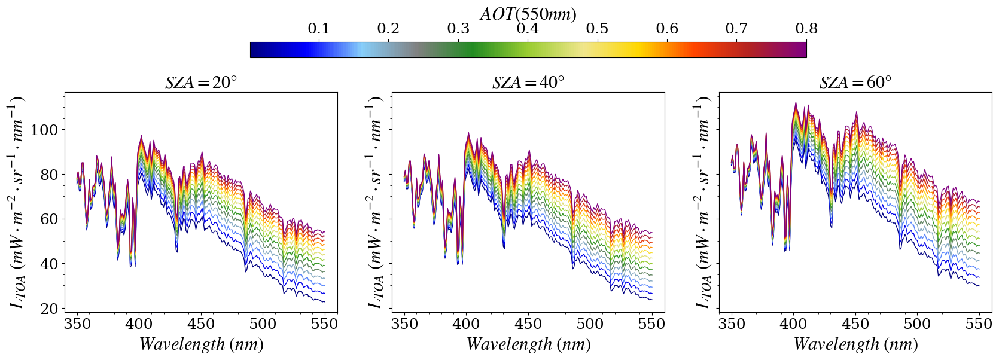

In [32]:
fwhm=1
central_wl=lut.Rdiff_lut.wl
signal = Ttot
wl_signal = Ttot.wl.values
spectral=radoc.Spectral(central_wl,fwhm)
Tg = spectral.convolve(signal)

signal = solar_irr.tsis
F0 = spectral.convolve(signal)

Rtoa=Tg*lut.Rdiff_lut.squeeze()*F0/np.pi


cmap = mpl.colors.LinearSegmentedColormap.from_list("",
                                                    ['navy', "blue", 'lightskyblue',
                                                     "grey",   'forestgreen','yellowgreen',
                                                     "khaki", "gold",
                                                     'orangered', "firebrick", 'purple'])

norm = mpl.colors.Normalize(vmin=0.001,vmax=0.8)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

sm.set_array([])
fig,axs = plt.subplots(1,3,figsize=(20,6.5),sharey=True)
axs=axs.ravel()

for isza, sza in enumerate(Rtoa.sza.values):
    ax=axs[isza]
    for aot_ref in Rtoa.aot_ref.values[::2]:
        Rtoa_=Rtoa.sel(wl=slice(300,550)).sel(sza=sza,aot_ref=aot_ref) #+ Tabs*Ttot*  np.pi * Rrs
        #Rsim.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),add_legend=False,ls=':',lw=1,ax=axs[i_])
        Rtoa_.plot(x='wl',color=cmap(norm(aot_ref)),lw=1,ax=ax)
    ax.set_title(r'$SZA='+str(sza)+r'\degree$')
    ax.set_ylabel(r'$L_{TOA}\ (mW\cdot m^{-2}\cdot sr^{-1}\cdot nm^{-1})$')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.minorticks_on()

cb = fig.colorbar(sm, ax=axs[:], shrink=0.6, aspect=35, pad=0.115, location='top')
cb.set_label(r'$AOT(550nm)$', fontsize=22)

NameError: name 'rot' is not defined

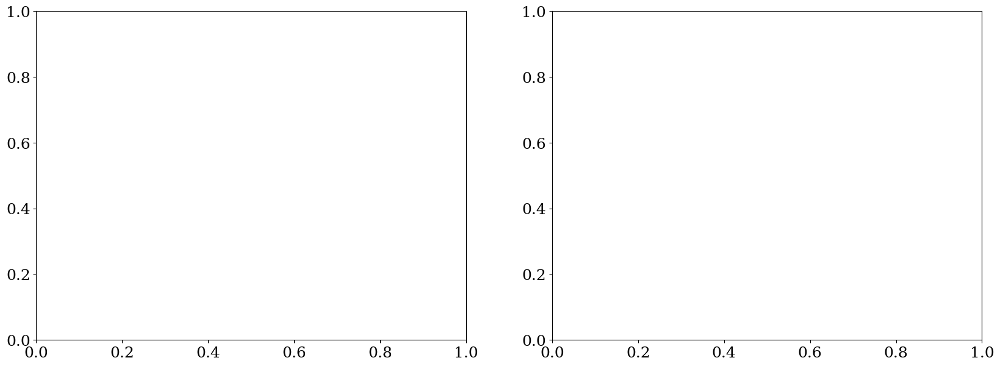

In [15]:
brdfg_ref=0.001
sza=40
vza=0
raa=0


azi=180-raa
def transmittance_dir(aot,M,rot=0):    
    return np.exp(-(rot+aot)*M)


fig,axs = plt.subplots(1,2,figsize=(20,7))#,sharex=True)
axs=axs.ravel()
model='COAV_rh70' 
model_trans='MACL_rh70' 
norm = mpl.colors.Normalize(vmin=0.001,vmax=1.1)

Rtoa_lut = lut.aero_lut.I.sel(model=model,aot_ref=slice(0.,0.74)).sel(sza=sza,vza=vza,azi=(180-raa)%360,method='nearest').squeeze()/np.cos(np.radians(sza))
Rtoa_lut = Rtoa_lut.interp(wl=wl,method='cubic')

aot=lut.aero_lut.sel(model=model).aot.interp(wl=wl,method='cubic')
lut.rot

Tdir = transmittance_dir(aot,M,rot=rot)
sunglint_corr = Tdir * sunglint_eps
sunglint_toa=sunglint_corr *brdfg_ref#( pixel.sel(wl=slice(2150,2350))-Rtoa_lut.sel(wl=slice(2150,2350))).mean(dim='wl')
#sunglint_toa.Rtoa.plot(x='wl',hue='aot_ref',ax=axs[0])

    
    
# atmospheric transmittances
_wind=2
Ttot_Ed_ = Ttot_Ed.sel(model=model_trans).sel(wind=_wind, method='nearest').interp(sza=sza).interp(wl=wl, method='cubic').Ttot_Ed
Ttot_Lu_ = Ttot_Ed.sel(model=model_trans).sel(wind=_wind, method='nearest').interp(sza=vza).interp(wl=wl, method='cubic').Ttot_Ed ** 1.05
#

lut.lut_preparation(wind=2,
                    sza=[20, 40, 60],
                    vza=[0],
                    azi=[0],
                    aot_refs=np.linspace(0.0, 0.8, 25),
                    weights=[0, 0.5, 1, 0., 0.])

Rsim =Tabs* ( sunglint_toa+Rtoa_lut)
for i_ in [0,1]:
   
    for aot_ref in Rtoa_lut.aot_ref.values[1:]:
        #Rtoa_lut.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),ls=':',lw=1,ax=axs[i_])
        Ttot = (Ttot_Ed_*Ttot_Lu_).interp( aot_ref=aot_ref, method='quadratic')
        Rsim_tot = Rsim.sel(aot_ref=aot_ref) #+ Tabs*Ttot*  np.pi * Rrs
        #Rsim.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),add_legend=False,ls=':',lw=1,ax=axs[i_])
        Rsim_tot.plot(x='wl',color=cmap(norm(aot_ref)),label=str(aot_ref),lw=1,ax=axs[i_])
    #Rtoa_sim= Rsim.interp(aot_ref=0.4)
    #Rtoa_sim.plot(x='wl',color='black',ls='--',ax=axs[i_])
    axs[i_].set_title(model)
    axs[i_].minorticks_on()
    axs[i_].legend(title='aot(550)')
axs[1].semilogy()
axs[1].set_ylim(1e-4,0.2)

axs[1].set_xlim(400,2200)

In [ ]:
wl_ref = np.linspace(360, 2550, 10000)
fwhm = spectral.fwhm.values
sig = spectral.Gamma2sigma(fwhm[0])
spectral.gaussian(wl_ref,fwhm[0] ,sig)

In [ ]:
def Gamma2sigma(Gamma):
    '''Function to convert FWHM (Gamma) to standard deviation (sigma)'''
    return Gamma * np.sqrt(2.) / (np.sqrt(2. * np.log(2.)) * 2.)


def gaussian(x, mu, sigma):
    return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-(x - mu) ** 2 / (2 * sigma ** 2))


wl_ref = np.linspace(360, 2550, 10000)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 4))

for mu, fwhm in RSR.groupby('wl'):
    sig = Gamma2sigma(fwhm.values)
    rsr = gaussian(wl_ref, mu, sig)
    axs.plot(wl_ref, rsr, '-k', lw=0.5, alpha=0.4)
axs.set_xlabel('Wavelength (nm)')
axs.set_ylabel('Spectral response function')



In [ ]:
RSR.values[0:2]

In [ ]:
gas_trans = acutils.GaseousTransmittance()

In [ ]:
brdfg_ref=0
fig,axs = plt.subplots(1,2,figsize=(20,5),sharex=True)
axs=axs.ravel()
model='COAV_rh70'    

Rtoa_lut = aero_lut.I.sel(model=model,aot_ref=slice(0.,0.74)).sel(sza=sza,vza=vza,azi=azi,method='nearest').squeeze()/np.cos(np.radians(sza))

Rtoa_lut=Rtoa_lut.interp(wl=wl,method='cubic')

aot=aero_lut.sel(model=model).aot.interp(wl=wl,method='cubic')
Tdir = transmittance_dir(aot,M,rot=rot)
sunglint_corr = Tdir * sunglint_eps
sunglint_toa=sunglint_corr *brdfg_ref#( pixel.sel(wl=slice(2150,2350))-Rtoa_lut.sel(wl=slice(2150,2350))).mean(dim='wl')
#sunglint_toa.Rtoa.plot(x='wl',hue='aot_ref',ax=axs[0])

Rsim = Tabs*( sunglint_toa+Rtoa_lut)
for i_ in [0,1]:
    s2_arr.Rtoa.plot(hue='time',marker='o',ax=axs[i_])
    for aot_ref in Rtoa_lut.aot_ref.values[1:]:
        #Rtoa_lut.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),ls=':',lw=1,ax=axs[i_])
        Rsim.sel(aot_ref=aot_ref).plot(x='wl',color=cmap(norm(aot_ref)),label=str(aot_ref),lw=1,ax=axs[i_])
    #Rtoa_sim= Rsim.interp(aot_ref=0.4)
    #Rtoa_sim.plot(x='wl',color='black',ls='--',ax=axs[i_])
    axs[i_].set_title(model)
    axs[i_].minorticks_on()
    axs[i_].legend(title='aot(550)')
axs[1].semilogy()
axs[1].set_ylim(1e-3,0.2)

axs[1].set_xlim(400,1100)